<a href="https://colab.research.google.com/github/was101/KDT3-/blob/main/Mini_project_1_team.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 필요한 라이브러리 임포트 과정
import cv2 # opencv
import tensorflow as tf # tensorflow
import numpy as np # numpy
import pandas as pd # pandas
import matplotlib.pyplot as plt # matplot
import matplotlib.cm as cm
import seaborn as sns # seaborn (matplot 확장팩)
import scipy as sp # grad-cam을 사|용하기 위한 라이브러리
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.models import Sequential # 모델을 Sequential형식으로 만들기 위해 임포트
# from tensorflow.keras.layers import Input, Dense, Flatten, BatchNormalization, ReLU, Dropout, LSTM, RNN
from tensorflow.keras import Model, layers # 모델 생성에 필요한 모델과 layer 설정을 위한 laters를 임포트
from tensorflow.keras.optimizers import Adam # optimizer를 Adam으로 주고, "Learning rate"를 따로 설정하기 위해 임포트
from tensorflow.keras.metrics import AUC # 모델에서 딥러닝 모델이 한 사이클이 끝나고 나타낼 지표인 AUC를 표시하기 위해서 AUC를 임포트
import os # 폴더명을 인식하여 여러개의 이미지 파일을 불러 오기 위하여 os 라이브러리를 임포트
from tensorflow.keras.applications import ResNet50 # VGG-16 모델을 임포트

# # seaborn plot을 이쁘게 꾸며주기
# palette = sns.color_palette('Default')
# sns.palplot(palette)
#train 폴더에 있는 train data file 이름을 읽어오기
path_tr = "/content/drive/Shareddrives/딥러닝 1조/chest X-Ray/train_images/train_images"
os.chdir(path_tr)
train = os.listdir(path_tr)

# path_te = "/content/drive/Shareddrives/딥러닝 1조/chest X-Ray/test_images/test_images"
# os.chdir(path_te)
# test = os.listdir(path_te)

FileNotFoundError: ignored

In [ ]:
# train data 및 test 데이터 생성
X_train, y_train, X_test, y_test , csv= [], [], [], [], []

#csv를 pandas로 가져오기
csv = pd.read_csv('/content/drive/Shareddrives/딥러닝 1조/chest X-Ray/labels_train.csv')

# train 폴더에 있는 file들의 이름으로 각각의 이미지를 opencv로 불러와서 X_train에 넣어주기
# Y_train은 csv에 들어있는 file_name 컬럼에 파일명이 있으면 append 시켜주기
# for문으로 train data의 파일명들을 i로 할당
for i in train:

  # 파일 개수를 지정해서 해당 개수 이상의 파일이 저장되었을 경우, for문 중지
  # if len(X_train) > 3000:
  #   break
  # 파일명에 .jpg가 포함되어 있거나 '('가 포함되지 않았으면 실행
  if ".jpg" in i and '(' not in i:

    # img 변수에 opencv로 i의 파일명을 가진 이미지 파일을 가져와서 할당
    img = cv2.imread(i)

    # img로 할당된 이미지 데이터를 224 X 224 사이즈로 바꿔 X_train에 append 시키기
    X_train.append(cv2.resize(img, (224, 224)))

    # csv안에 파일이 없으면 해당 파일명과 파일명의 끝에 있는 문자열을 출력
    if csv[csv["file_name"] == i].size == 0: print(i,'===',i[-1])

    # y_train에 i에 할당된 파일명과 일치한 데이터가 있으면 class_id를 가져온다. (0 : normal, 1 : bacterial, 2 : viral)
    y_train.append(csv[csv["file_name"] == i].iloc[:,1].to_numpy()[0])

# for i in test:
#   if ".jpg" in i:
#     img = cv2.imread(i)
#     X_test.append(cv2.resize(img,(224,224)))

# 각각의 데이터들을 numpy array 데이터 형식으로 바꿔줌
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)

In [ ]:
# y_train 데이터 형식을 float32(32비트 범위의 실수형)으로 바꿔준다.
X_train = X_train.astype('float32') / 255.0
y_train = y_train.astype('float32')

In [ ]:
# 각각의 데이터들의 shape을 보여준다.
print(X_train.shape)
# print(X_test.shape)
print(y_train.shape)
# print(y_test.shape)

(4532, 224, 224, 3)
(4532,)


In [ ]:
# del model
leaky_relu = layers.LeakyReLU()
# VGG-16형식의 CNN 모델 구축
model  = tf.keras.Sequential([
    # (3, 3)형태로 이미지를 convolution하여 64개의 데이터로 추출한다. 이 과정 후 data shape = (224, 224, 64)
    # input_shape은 넣어줄 데이터의 형식울 맞춰줘야 하므로 (244, 244, 3)
    layers.Conv2D(64, (3,3), activation=leaky_relu, input_shape=(224, 224,3), padding='same'),

    #batch normalization을 진행
    layers.BatchNormalization(),

    layers.Conv2D(64, (3,3), activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),

    # 이미지를 각 각 (2, 2)형태로 나누어서 Max값으로 채워준다. 이 과정 후 data shape = (112, 112, 64)
    layers.MaxPooling2D(2,2),

    # (3, 3)형태로 이미지를 convolution하여 128개의 데이터로 추출한다. 이 과정 후 data shape = (112, 112, 128)
    layers.Conv2D(128, (3,3), activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(128, (3,3), activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),

    # 이미지를 각 각 (2, 2)형태로 나누어서 Max값으로 채워준다. 이 과정 후 data shape = (56, 56, 128)
    layers.MaxPooling2D(2,2),

    # (3, 3)형태로 이미지를 convolution하여 256개의 데이터로 추출한다. 이 과정 후 data shape = (56, 56, 256)
    layers.Conv2D(256,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(256,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(256,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),

    # 이미지를 각 각 (2, 2)형태로 나누어서 Max값으로 채워준다. 이 과정 후 data shape = (28, 28, 128)
    layers.MaxPooling2D(2,2),

    # (3, 3)형태로 이미지를 convolution하여 128개의 데이터로 추출한다. 이 과정 후 data shape = (28, 28, 512)
    layers.Conv2D(512,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(512,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(512,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),

    # 이미지를 각 각 (2, 2)형태로 나누어서 Max값으로 채워준다. 이 과정 후 data shape = (14, 14, 512)
    layers.MaxPooling2D(2,2),
    layers.Conv2D(512,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(512,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(512,(3,3),activation=leaky_relu, padding='same'),
    layers.BatchNormalization(),

    # 이미지를 각 각 (2, 2)형태로 나누어서 Max값으로 채워준다. 이 과정 후 data shape = (7, 7, 512)
    layers.MaxPooling2D(2,2),



    # 데이터를 1차원 데이터로 압축시킨다. 이 과정 후 data shape = (512)
    layers.Flatten(),

    # hidden layer를 총 2개 만들고, out layer를 만들어준다. hidden layer 진행할 때마다 data shape = (4096), out layer 진행 후 data shape = (1000)
    layers.Dense(4096, activation=leaky_relu),
    layers.Dropout(0.2),
    layers.Dense(4096, activation=leaky_relu),
    layers.Dropout(0.2),
    layers.Dense(1000, activation=leaky_relu),
    layers.Dropout(0.2),
    layers.Dense(3, activation='softmax')])

# 모델의 summary를 출력한다.
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 batch_normalization_1 (Batc  (None, 224, 224, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                        

In [ ]:

callback = tf.keras.callbacks.EarlyStopping(mode='max', patience=20, monitor='val_sparse_categorical_accuracy', restore_best_weights=True, verbose=1)

# 모델 컴파일 (모델이 각 데이터를 분석할 손실함수, optimizer, 지표를 설정해준다.)
model.compile(loss='sparse_categorical_crossentropy', # one hot Encoding을 하지만, 해당 데이터를 따로 만들어두진 않는다.
              optimizer=Adam(learning_rate=0.0005), # Adam 형식으로 learning rate를 0.001씩 주면서 딥러닝 진행.
              metrics=[tf.keras.metrics.SparseCategoricalAccuracy()]) # 하나의 epoch을 진행할 때마다 출력할 지표를 설정

# model에 데이터를 넣어 학습 시작.
# epoch : 몇 번의 사이클을 돌 것인지를 설정
# validation_split : validation data를 train data에서 몇 %로 따로 빼낼 것인지를 설정
history = model.fit(X_train, y_train, epochs=30, validation_split=0.2, callbacks=[callback])

Epoch 1/30
114/114 [==============================] - 112s 730ms/step - loss: 10.6989 - sparse_categorical_accuracy: 0.5239 - val_loss: 9.9741 - val_sparse_categorical_accuracy: 0.4719
Epoch 2/30
114/114 [==============================] - 70s 612ms/step - loss: 4.4334 - sparse_categorical_accuracy: 0.5705 - val_loss: 81.5021 - val_sparse_categorical_accuracy: 0.2370
Epoch 3/30
114/114 [==============================] - 76s 665ms/step - loss: 3.2760 - sparse_categorical_accuracy: 0.5879 - val_loss: 1.4327 - val_sparse_categorical_accuracy: 0.5105
Epoch 4/30
114/114 [==============================] - 75s 656ms/step - loss: 2.4381 - sparse_categorical_accuracy: 0.6168 - val_loss: 25.7653 - val_sparse_categorical_accuracy: 0.3032
Epoch 5/30
114/114 [==============================] - 75s 656ms/step - loss: 3.1235 - sparse_categorical_accuracy: 0.5950 - val_loss: 8.6297 - val_sparse_categorical_accuracy: 0.4895
Epoch 6/30
114/114 [==============================] - 74s 653ms/step - loss: 5.17

In [ ]:
# ResNet 모델 사용.. 하지만 결과는 너무 좋지 않으므로 패스
# RES_model = ResNet50(weights='imagenet', include_top = False, input_shape=(224,224,3), classifier_activation='softmax')
# x = RES_model.output
# x = layers.AveragePooling2D()(x)
# x = layers.Flatten()(x)
# x = layers.Dense(5000, activation=leaky_relu)(x)
# x = layers.Dropout(0.2)(x)
# x = layers.Dense(1000, activation=leaky_relu)(x)
# x = layers.Dropout(0.2)(x)
# x = layers.Dense(3, activation='softmax')(x)
# RES_model = Model(RES_model.input, x)
# RES_model.summary()

In [ ]:
# ResNet 모델 사용.. 하지만 결과는 너무 좋지 않으므로 패스

# RES_model.compile(loss='sparse_categorical_crossentropy', # one hot Encoding을 하지만, 해당 데이터를 따로 만들어두진 않는다.
#               optimizer=Adam(learning_rate=0.0005), # Adam 형식으로 learning rate를 0.001씩 주면서 딥러닝 진행.
#               metrics=[tf.keras.metrics.SparseCategoricalAccuracy()]) # 하나의 epoch을 진행할 때마다 출력할 지표를 설정

# # model에 데이터를 넣어 학습 시작.
# # epoch : 몇 번의 사이클을 돌 것인지를 설정
# # validation_split : validation data를 train data에서 몇 %로 따로 빼낼 것인지를 설정
# history = RES_model.fit(X_train, y_train, epochs=20, validation_split=0.2)

[0.4718853235244751, 0.23704519867897034, 0.5104740858078003, 0.30319735407829285, 0.4895259141921997, 0.4310915172100067, 0.3737596571445465, 0.6670341491699219, 0.6097022891044617, 0.36052921414375305, 0.5369349718093872, 0.6207276582717896, 0.6835722327232361, 0.5192943811416626, 0.7640573382377625, 0.33076074719429016, 0.5920617580413818, 0.5975744128227234, 0.581036388874054, 0.6361631751060486, 0.7750827074050903, 0.7155457735061646, 0.48511576652526855, 0.5567805767059326, 0.4509371519088745, 0.5534729957580566, 0.5126791596412659, 0.5942668318748474, 0.652701199054718, 0.6063947081565857]


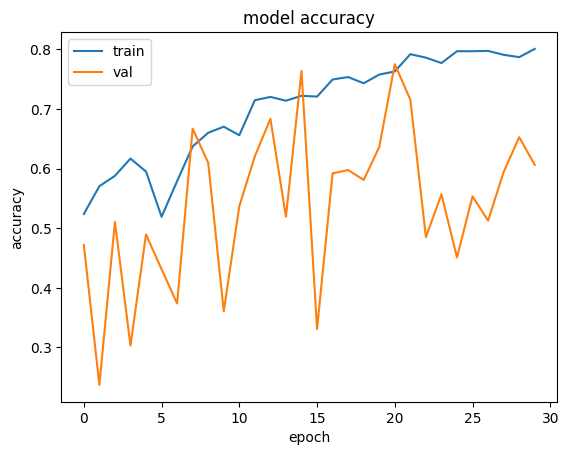

In [ ]:
# accuracy 분석
print(history.history['val_sparse_categorical_accuracy'])
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

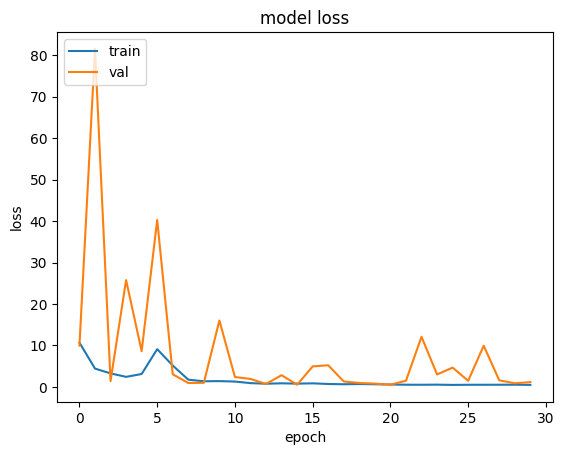

In [ ]:
# 잔차 분석
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# F1_score 구하기 (구현만 해놓았음... 세션 죽으니까 돌리지마세요!!! )
# 세션 죽으니까 돌리지마!!!!!!!!!!!!!!
# 세션 죽으니까 돌리지마!!!!!!!!!!!!!!
# 세션 죽으니까 돌리지마!!!!!!!!!!!!!!
# 세션 죽으니까 돌리지마!!!!!!!!!!!!!!
# 세션 죽으니까 돌리지마!!!!!!!!!!!!!!
# 세션 죽으니까 돌리지마!!!!!!!!!!!!!!
Precision = tf.keras.metrics.Precision()
Recall = tf.keras.metrics.Recall()
y_true = np.zeros((len(y_train), 3))
for i, n in enumerate(y_train):
  np.put(y_true[i], int(n), 1)
# y_pred = np.round(model.predict(X_train)).astype(int)
Precision.update_state(y_true, y_pred)
Precision = Precision.result().numpy()
print('Precision : ', Precision)
Recall.update_state(y_true, y_pred)
Recall = Recall.result().numpy()
print('Recall : ', Recall)
F1_score = 2*(Precision * Recall)/(Precision + Recall)
print('F1 Score : ', F1_score)

Precision :  0.7868517
Recall :  0.7632392
F1 Score :  0.7748656186349338


1
Pneumonia diagnosis results is Normal


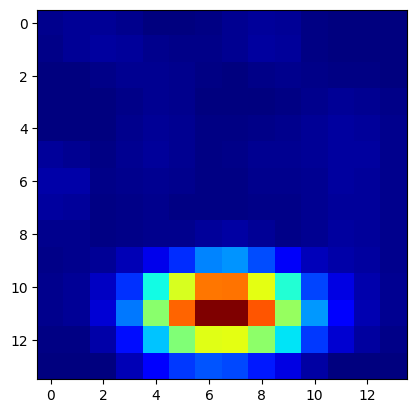

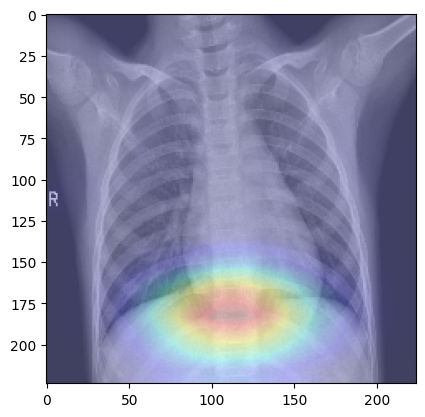

1
Pneumonia diagnosis results is viral


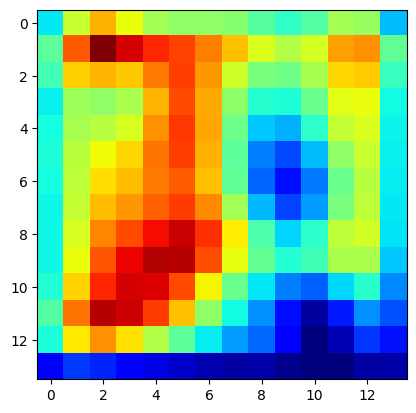

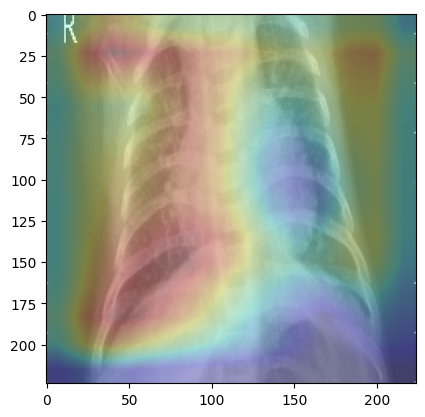

1
Pneumonia diagnosis results is viral


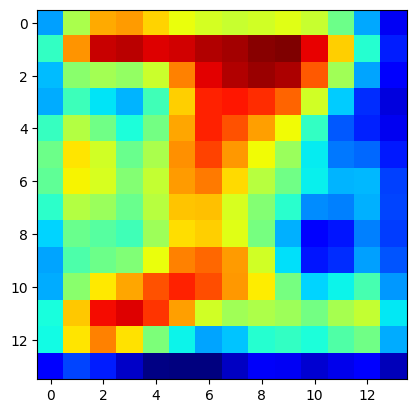

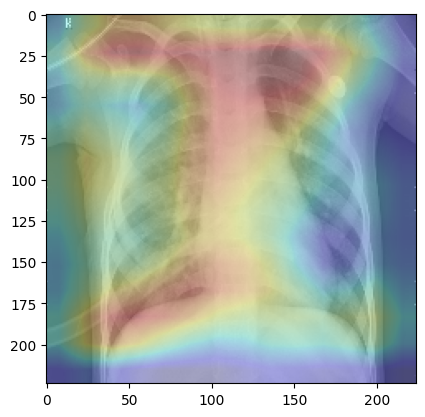

1
Pneumonia diagnosis results is viral


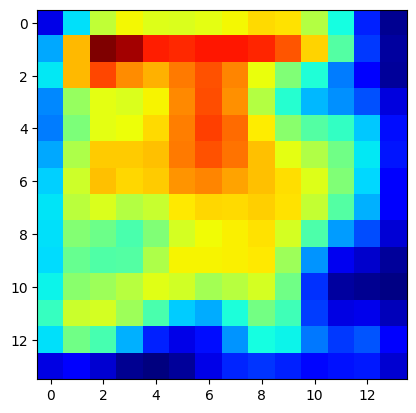

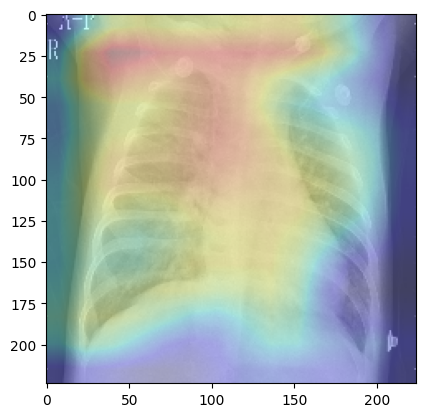

1
Pneumonia diagnosis results is Normal


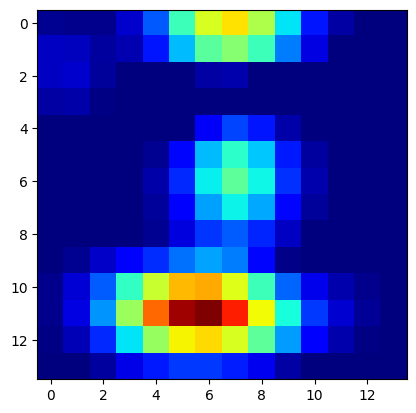

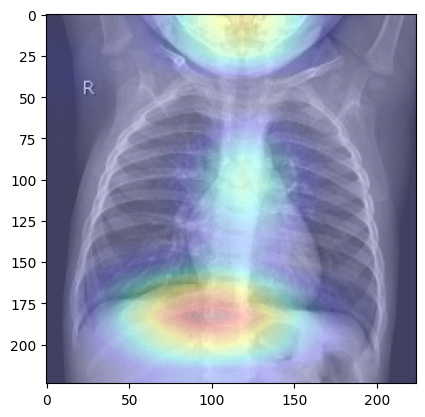

1
Pneumonia diagnosis results is Normal


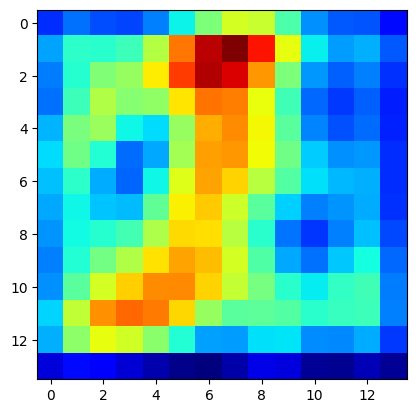

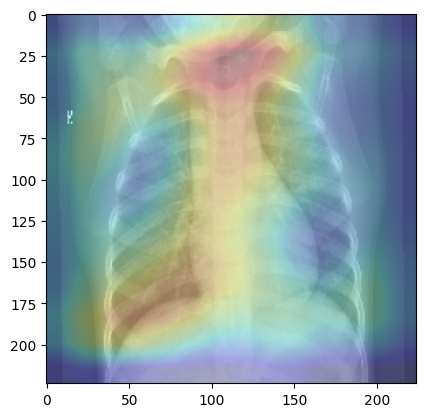

1
Pneumonia diagnosis results is bacterial


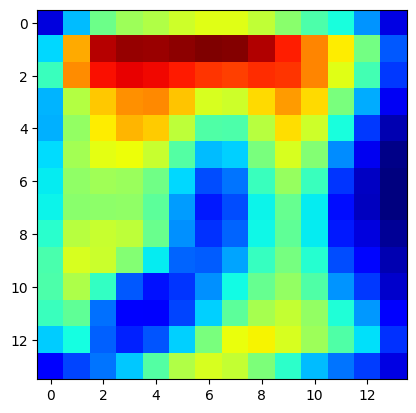

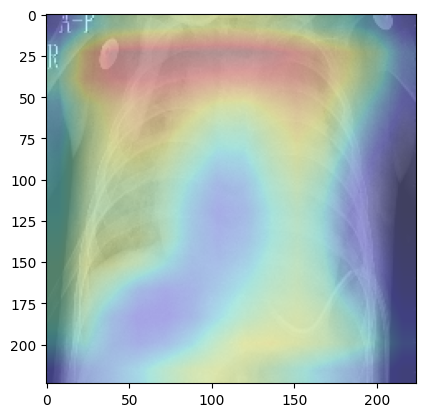

1
Pneumonia diagnosis results is bacterial


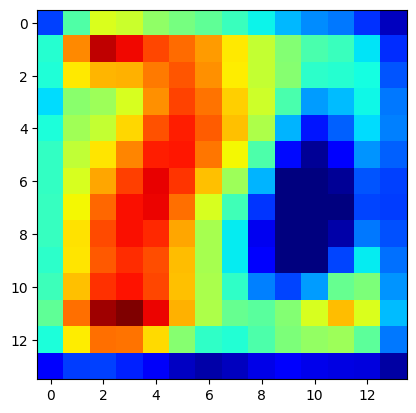

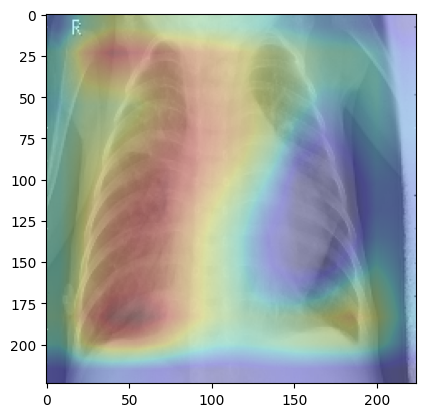

1
Pneumonia diagnosis results is bacterial


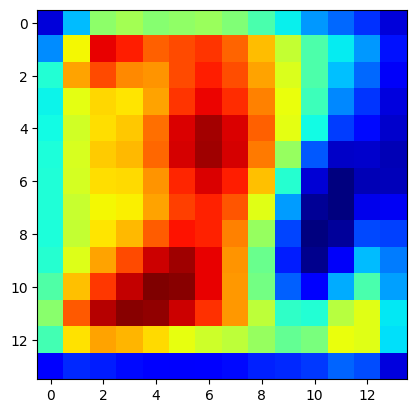

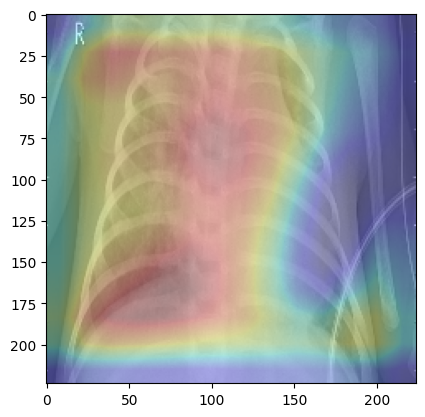

1
Pneumonia diagnosis results is viral


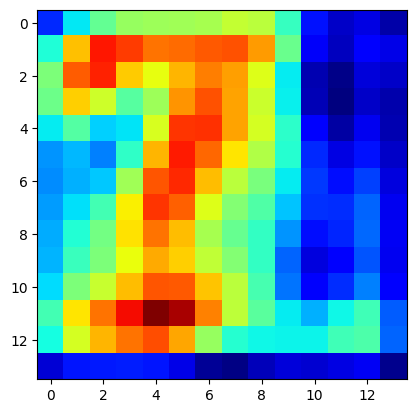

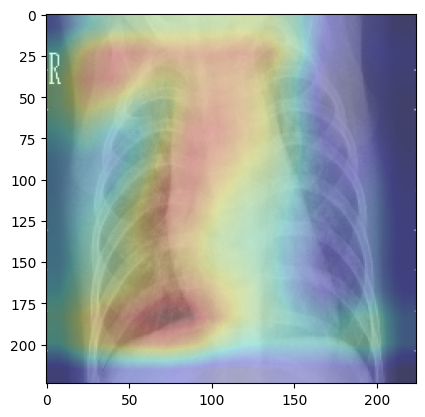

1
Pneumonia diagnosis results is bacterial


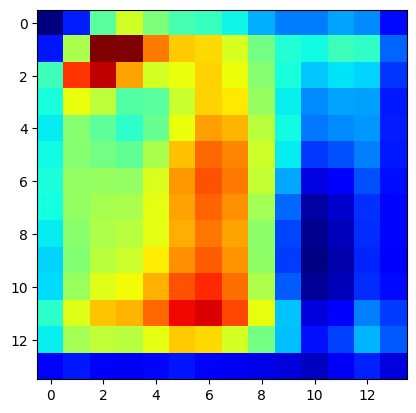

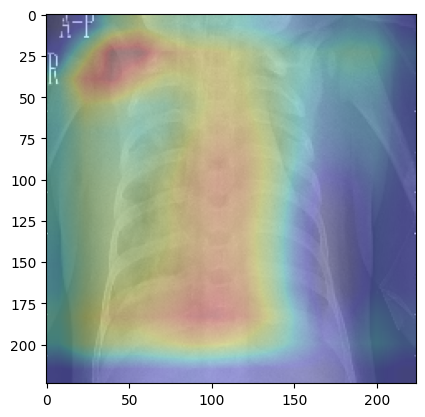

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


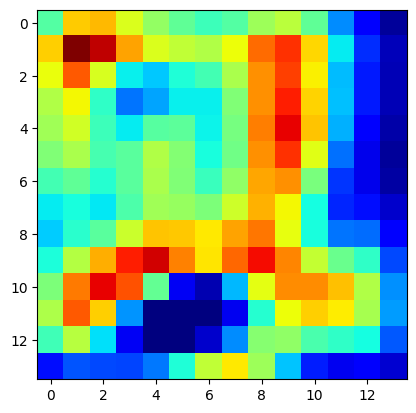

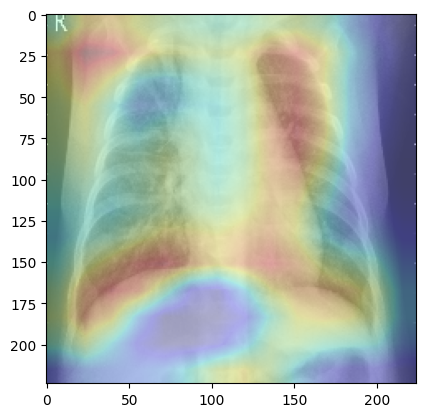

1
Pneumonia diagnosis results is Normal


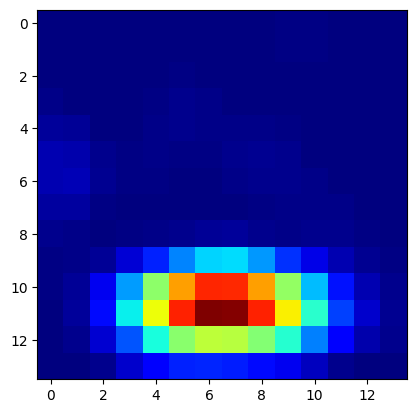

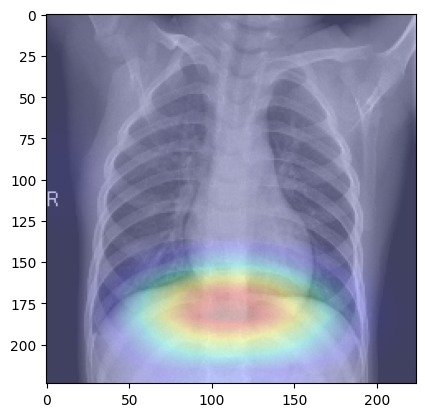

0
error => 결과가 없음
0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


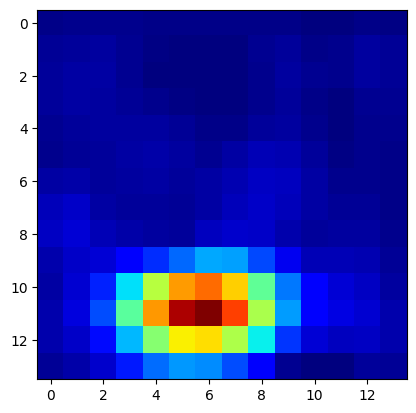

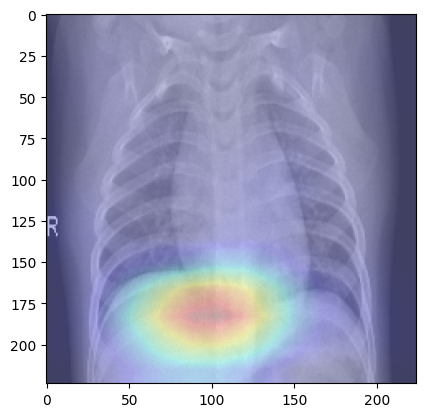

1
Pneumonia diagnosis results is viral


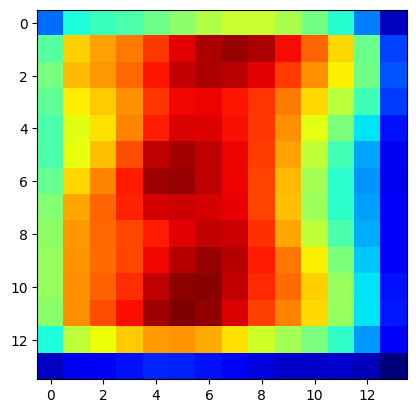

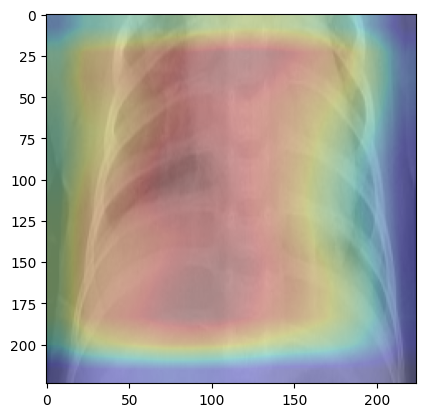

1
Pneumonia diagnosis results is Normal


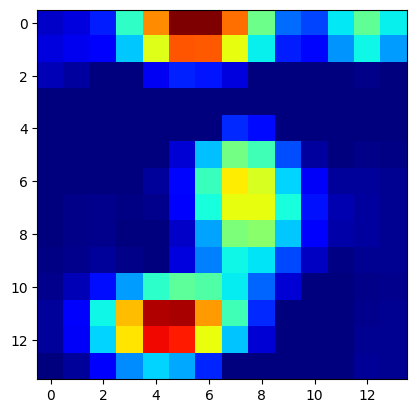

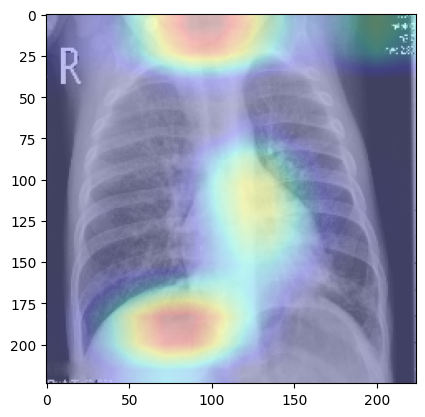

1
Pneumonia diagnosis results is viral


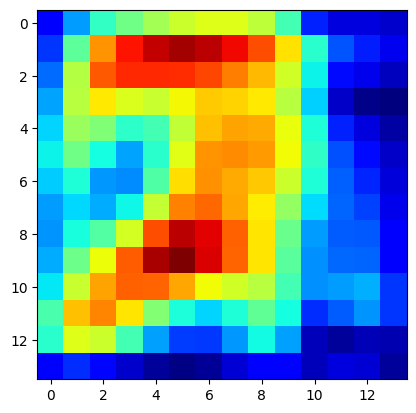

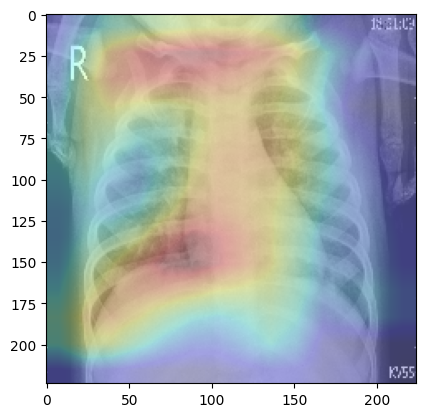

1
Pneumonia diagnosis results is Normal


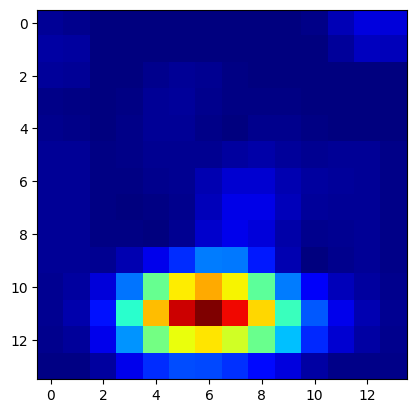

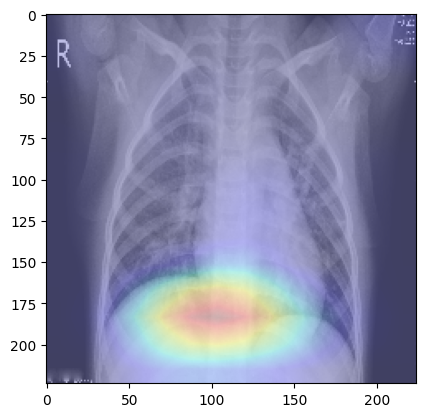

1
Pneumonia diagnosis results is bacterial


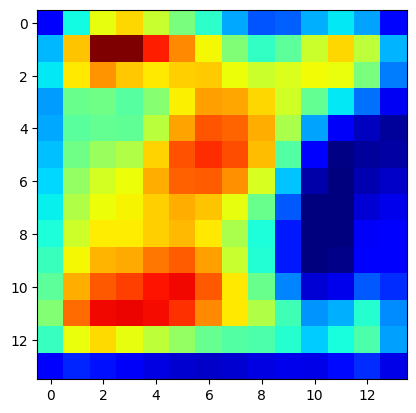

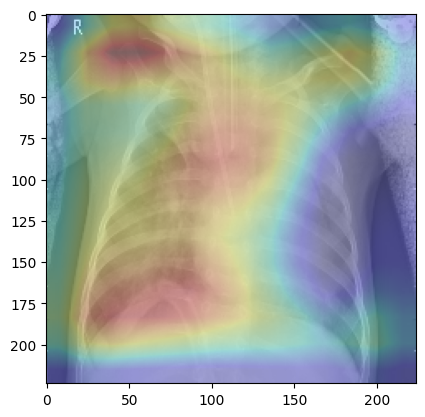

1
Pneumonia diagnosis results is viral


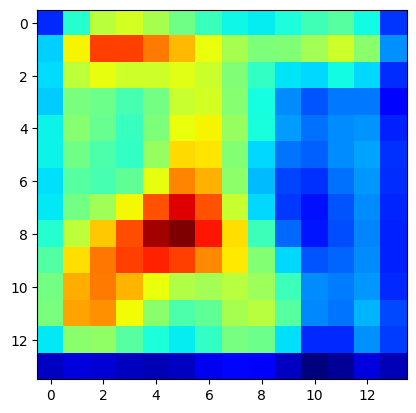

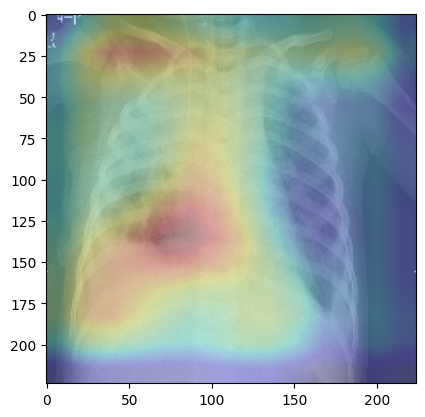

1
Pneumonia diagnosis results is Normal


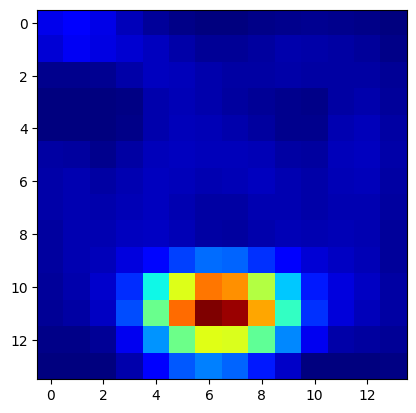

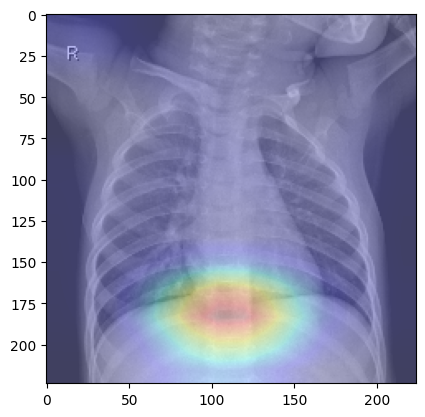

1
Pneumonia diagnosis results is Normal


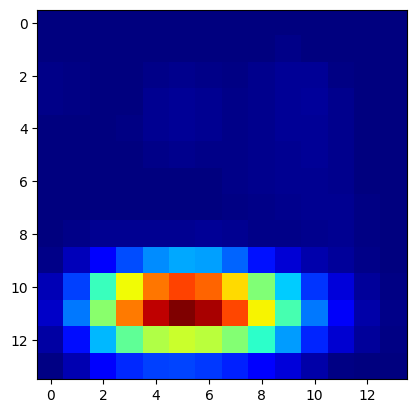

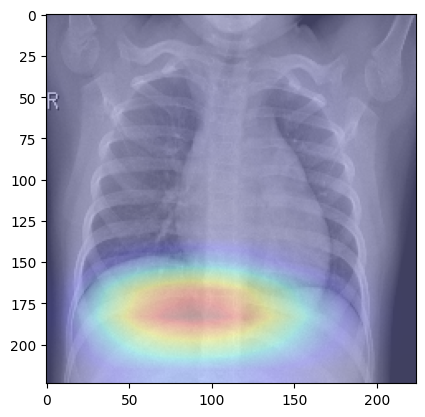

1
Pneumonia diagnosis results is Normal


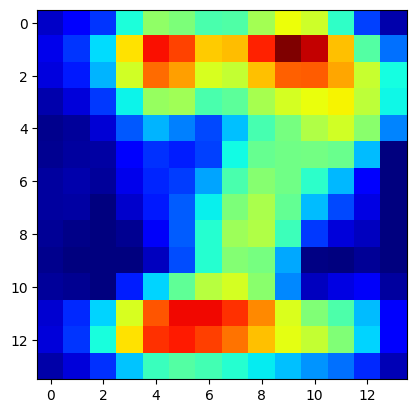

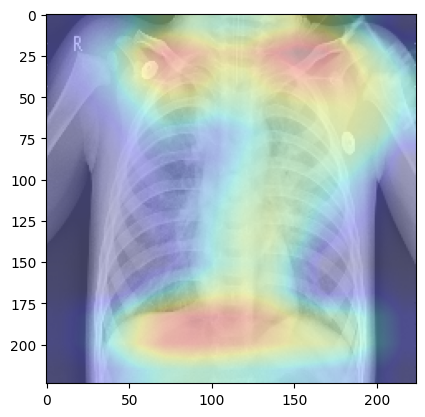

1
Pneumonia diagnosis results is viral


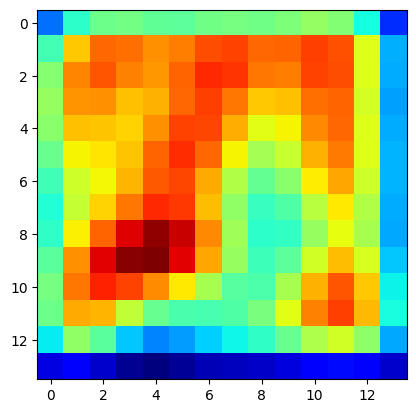

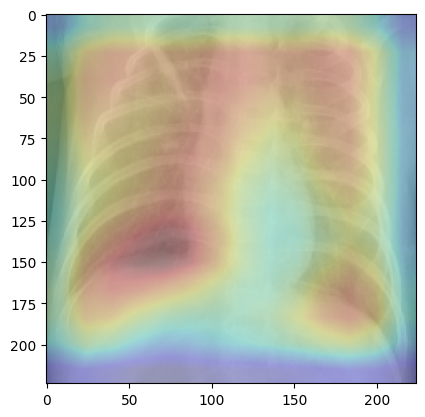

1
Pneumonia diagnosis results is Normal


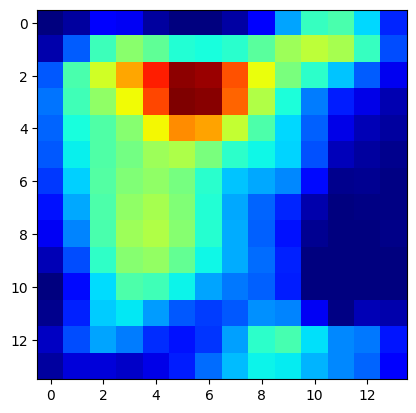

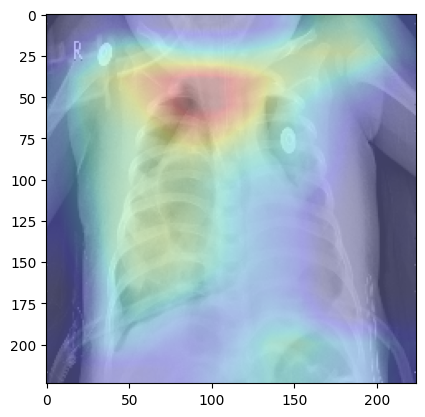

1
Pneumonia diagnosis results is bacterial


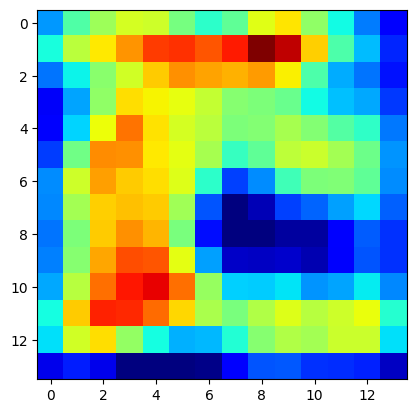

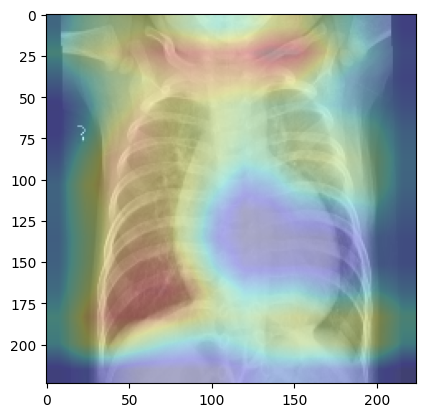

1
Pneumonia diagnosis results is viral


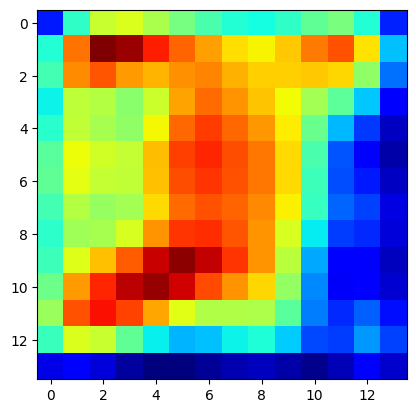

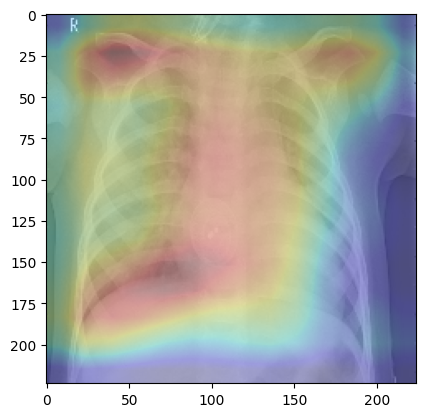

1
Pneumonia diagnosis results is Normal


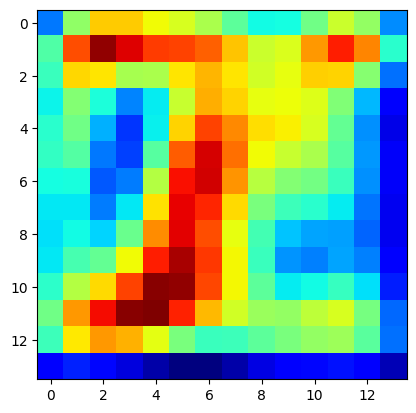

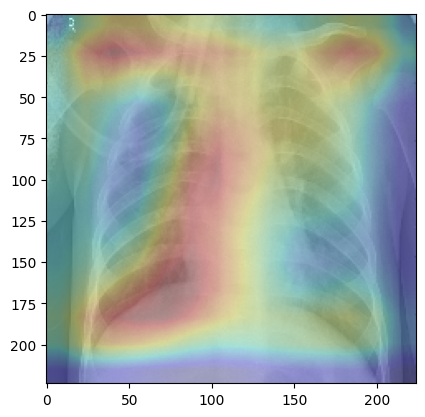

0
error => 결과가 없음
1
Pneumonia diagnosis results is bacterial


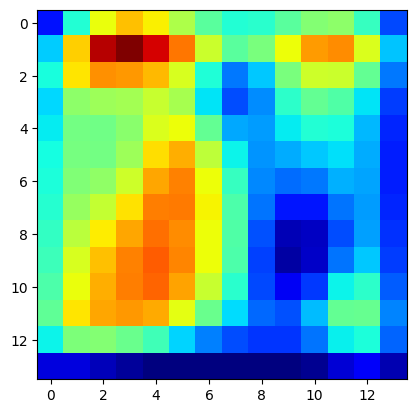

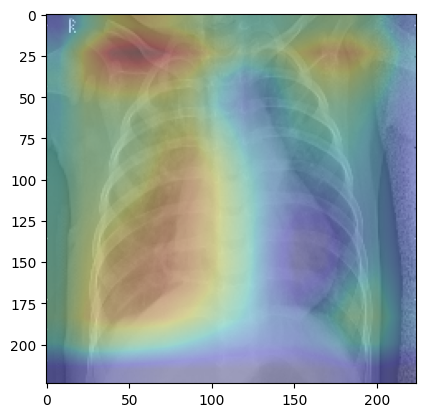

1
Pneumonia diagnosis results is Normal


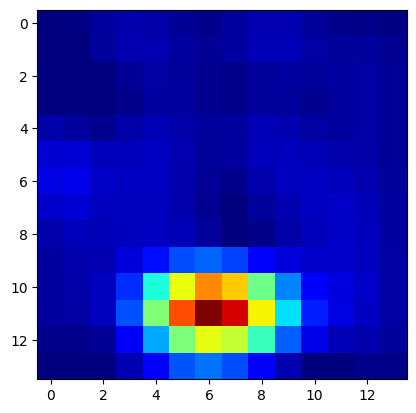

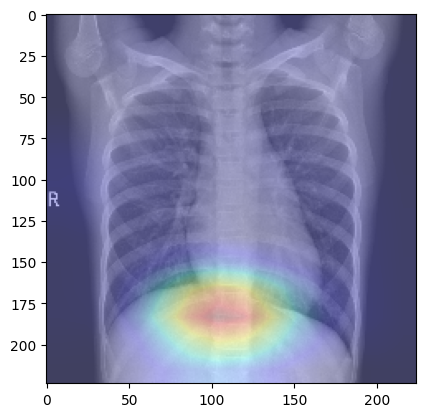

1
Pneumonia diagnosis results is bacterial


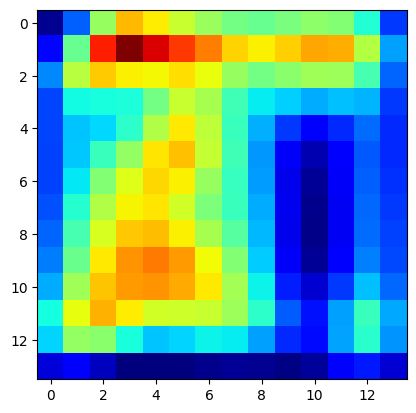

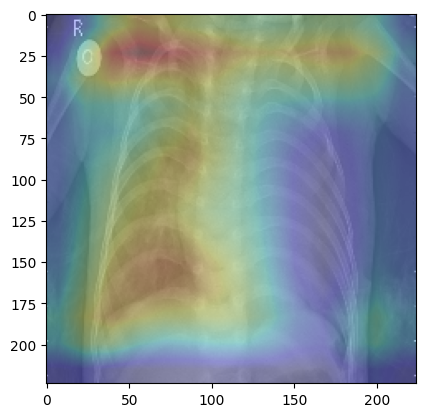

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


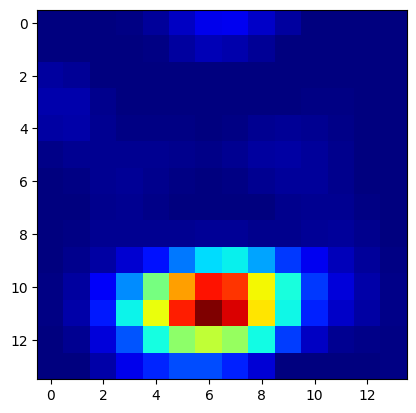

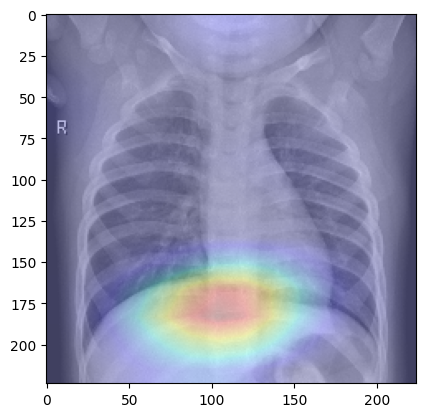

1
Pneumonia diagnosis results is viral


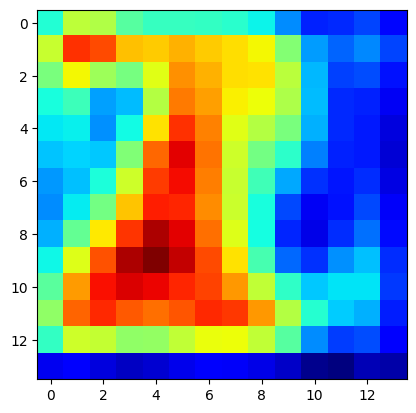

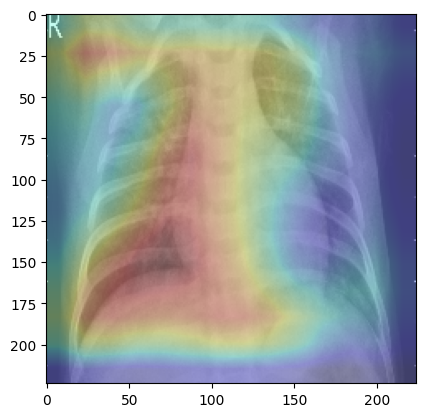

1
Pneumonia diagnosis results is Normal


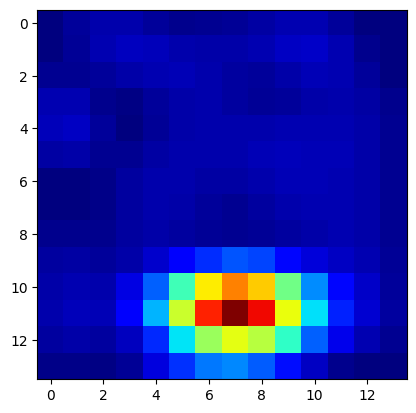

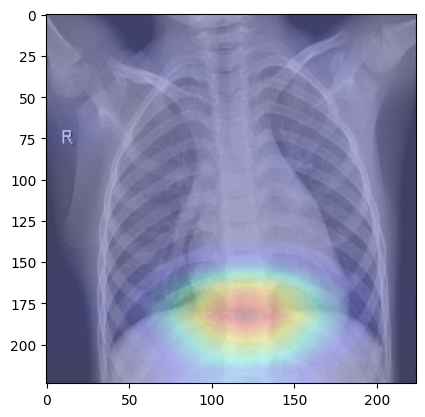

1
Pneumonia diagnosis results is viral


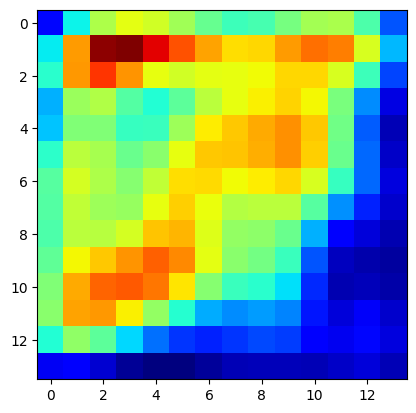

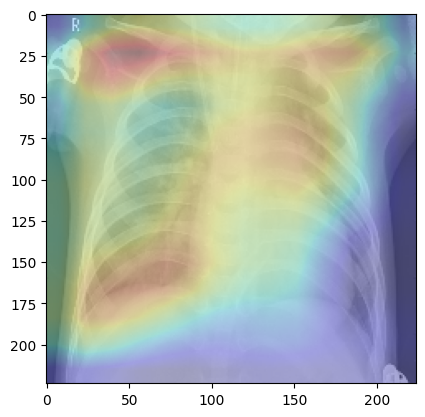

1
Pneumonia diagnosis results is bacterial


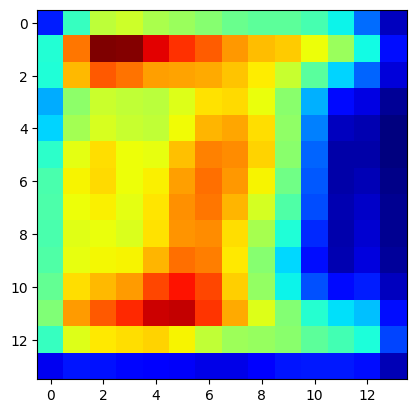

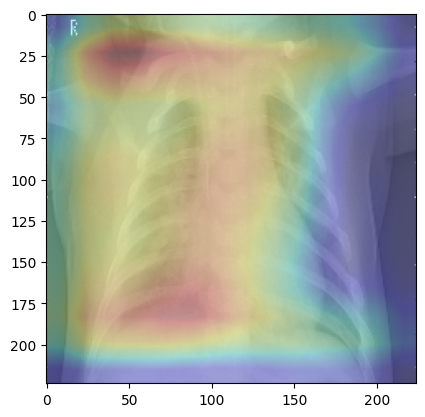

1
Pneumonia diagnosis results is viral


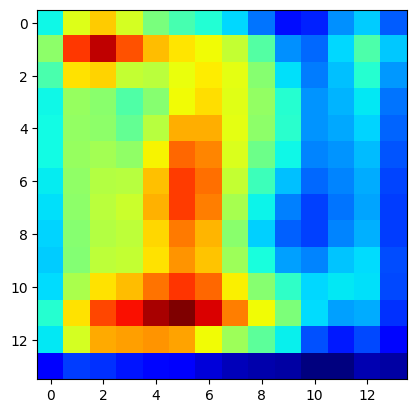

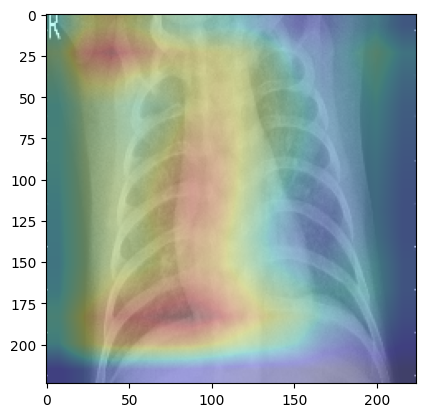

1
Pneumonia diagnosis results is Normal


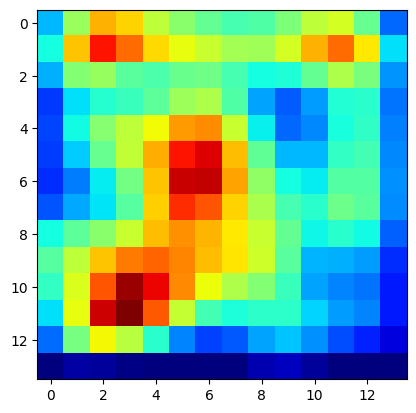

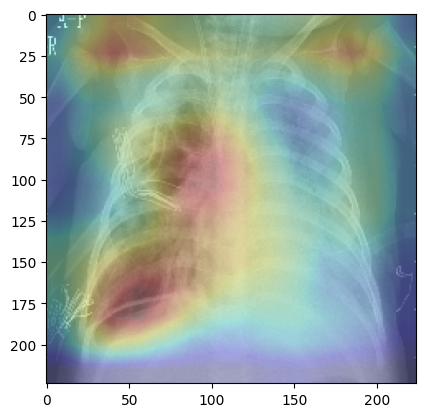

1
Pneumonia diagnosis results is viral


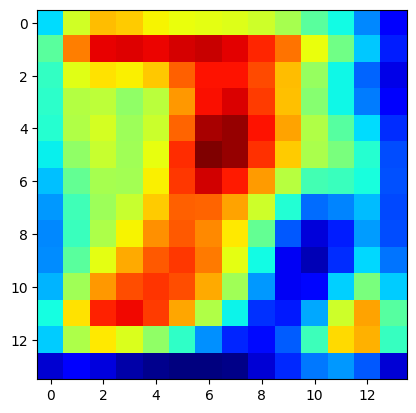

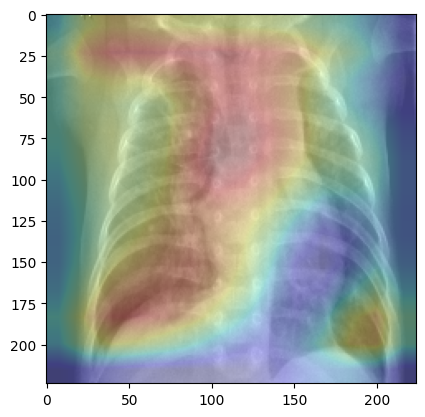

1
Pneumonia diagnosis results is viral


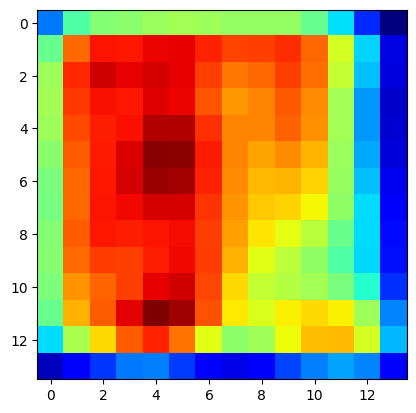

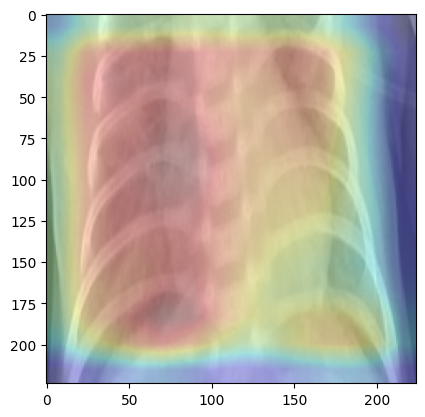

1
Pneumonia diagnosis results is Normal


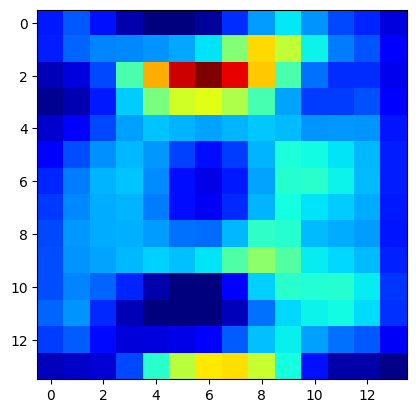

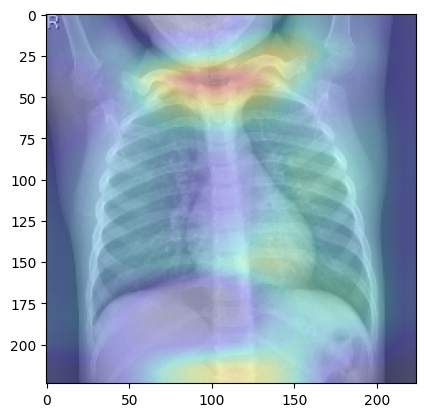

0
error => 결과가 없음
0
error => 결과가 없음
1
Pneumonia diagnosis results is viral


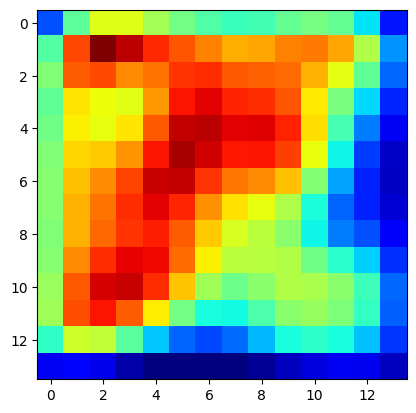

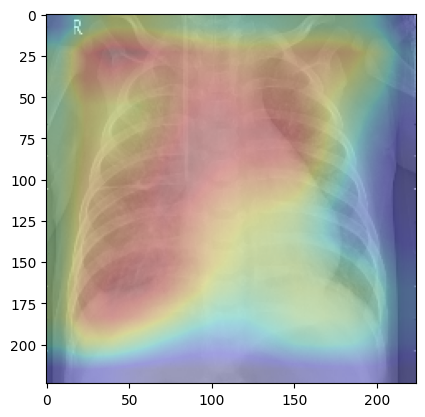

1
Pneumonia diagnosis results is viral


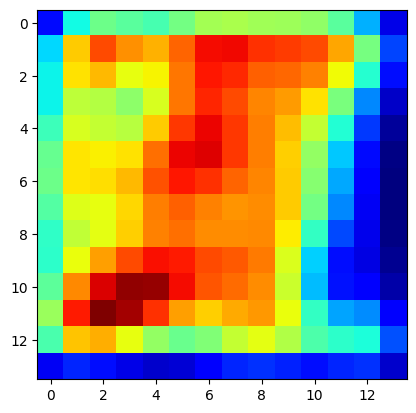

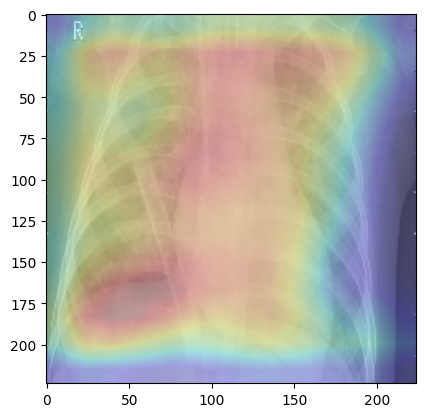

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


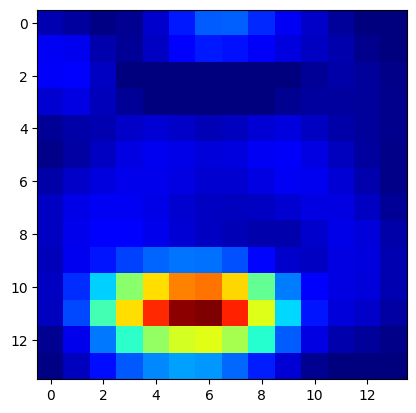

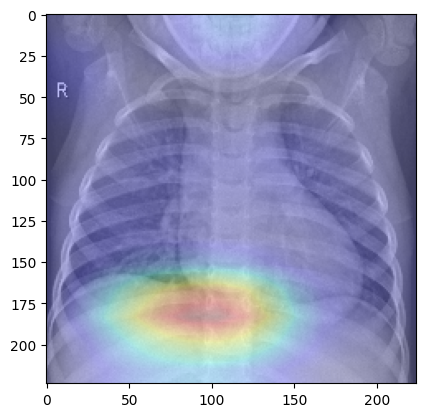

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


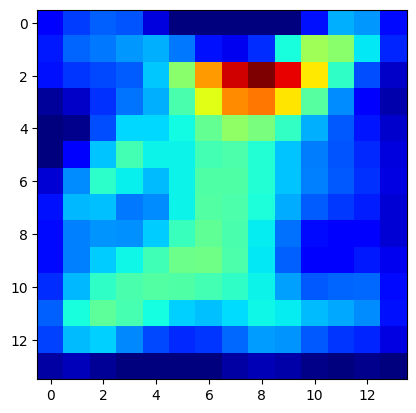

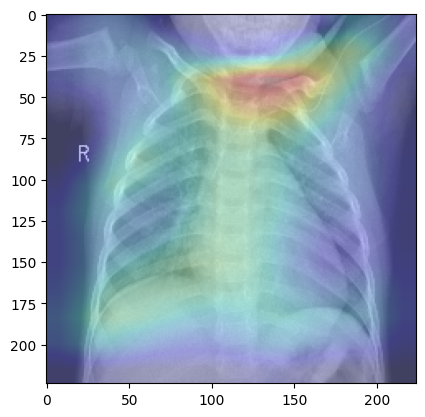

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


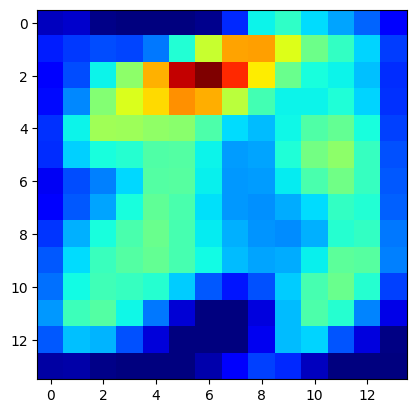

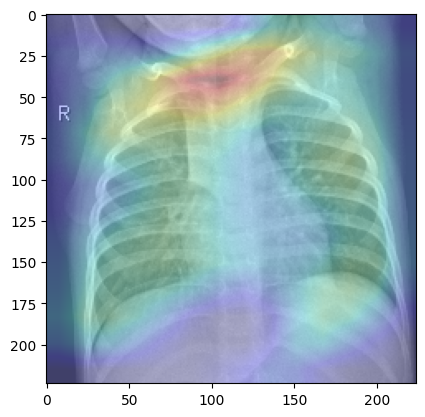

1
Pneumonia diagnosis results is Normal


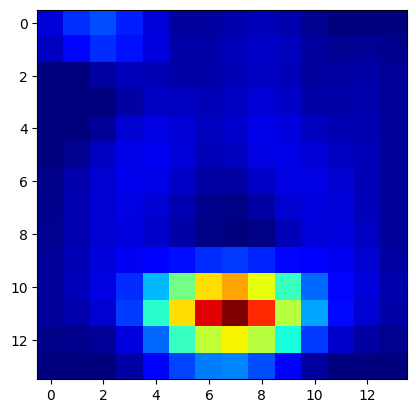

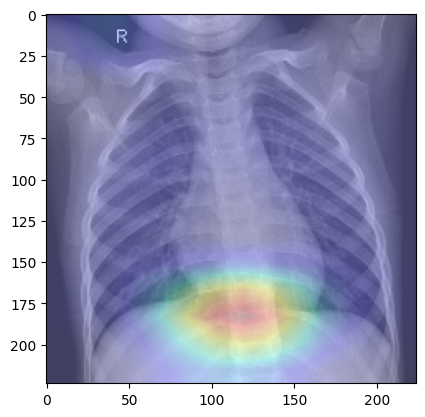

1
Pneumonia diagnosis results is bacterial


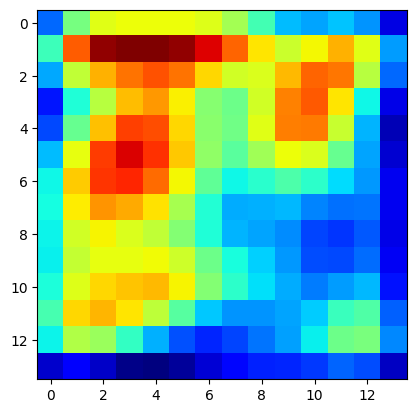

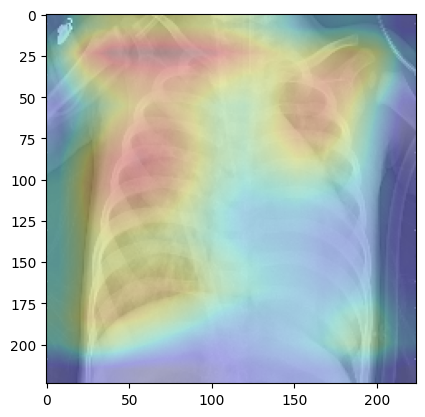

1
Pneumonia diagnosis results is Normal


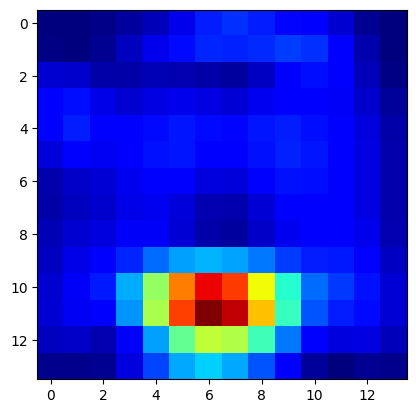

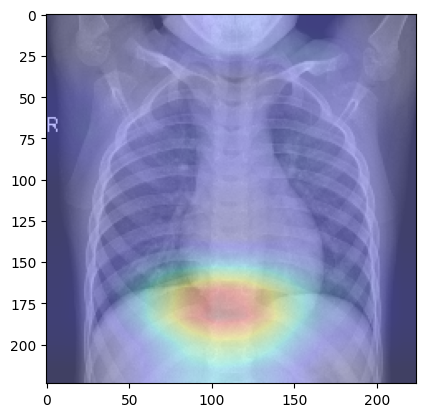

1
Pneumonia diagnosis results is Normal


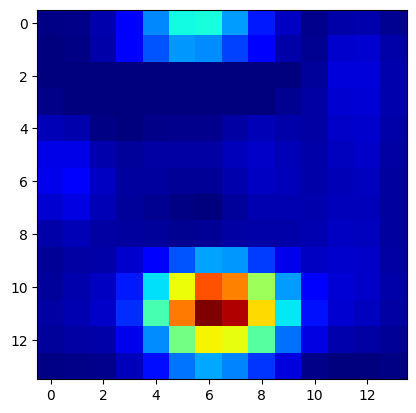

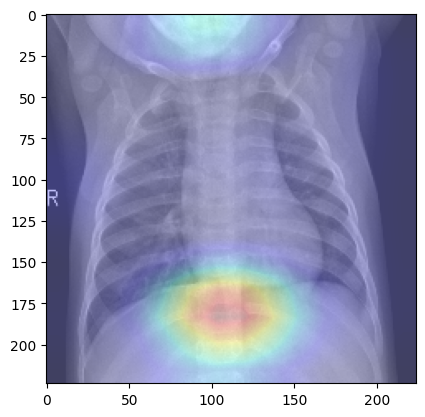

1
Pneumonia diagnosis results is bacterial


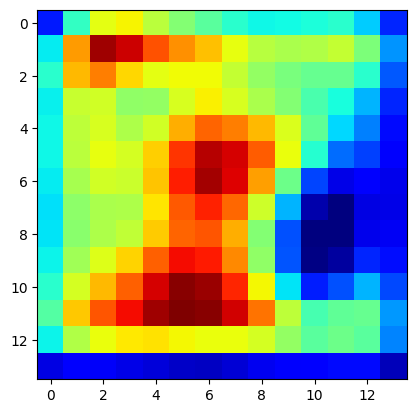

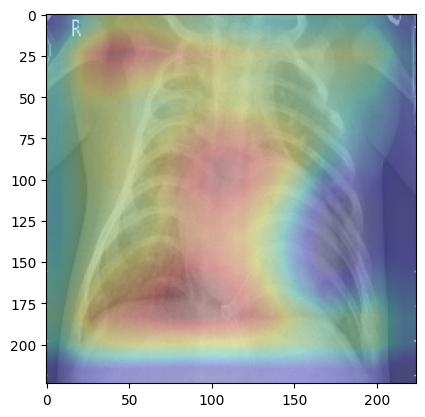

1
Pneumonia diagnosis results is Normal


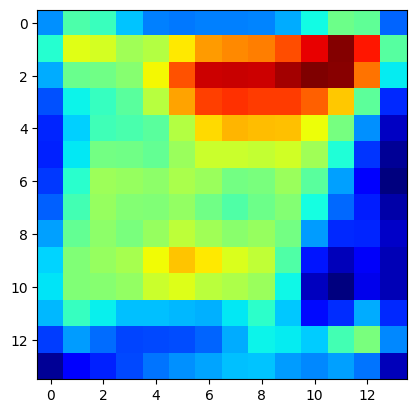

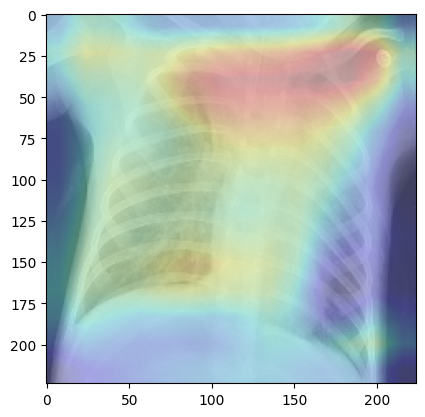

1
Pneumonia diagnosis results is viral


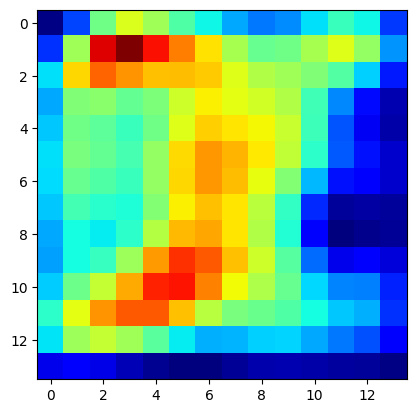

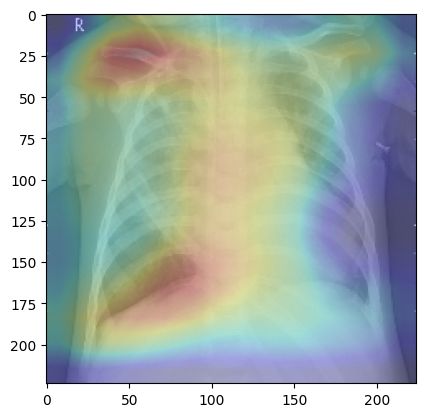

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


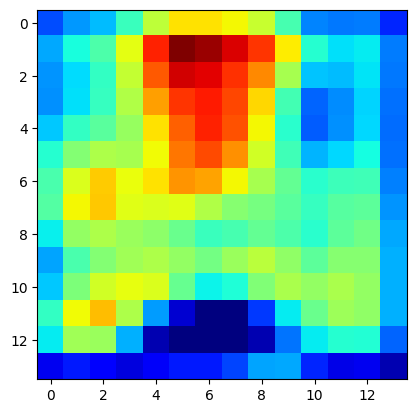

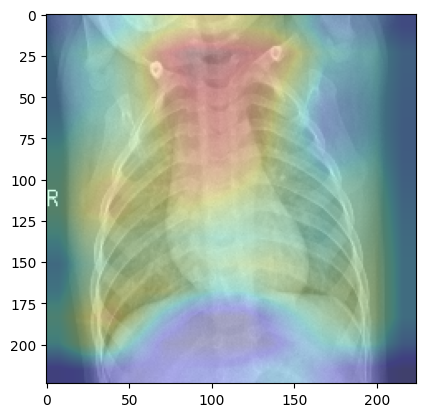

1
Pneumonia diagnosis results is viral


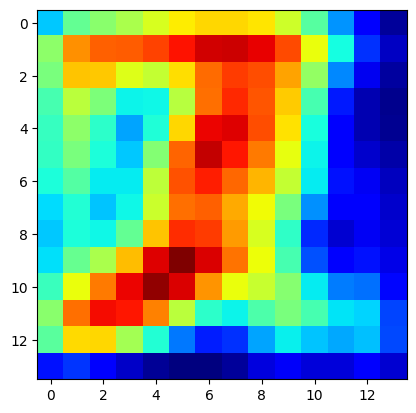

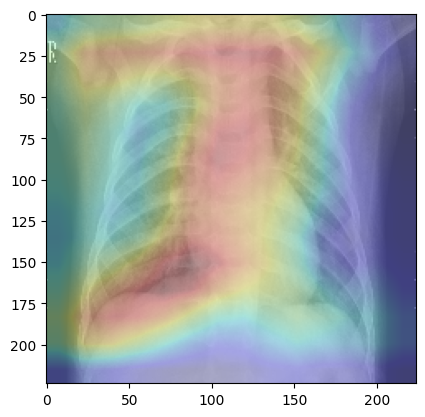

1
Pneumonia diagnosis results is bacterial


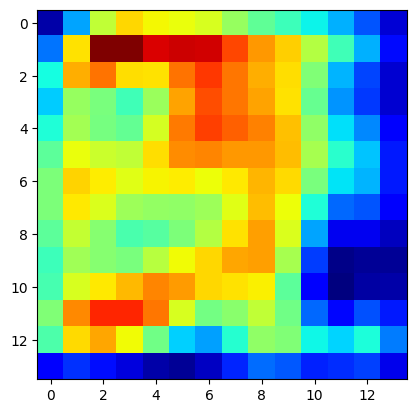

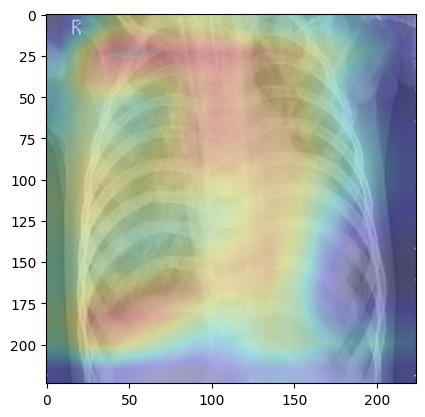

1
Pneumonia diagnosis results is Normal


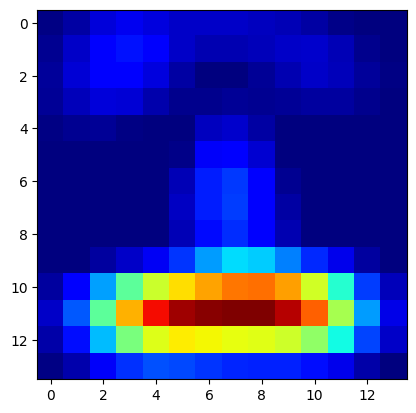

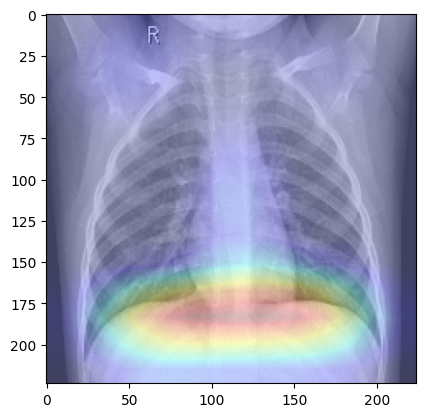

1
Pneumonia diagnosis results is viral


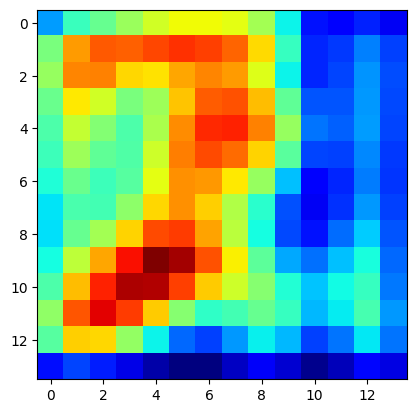

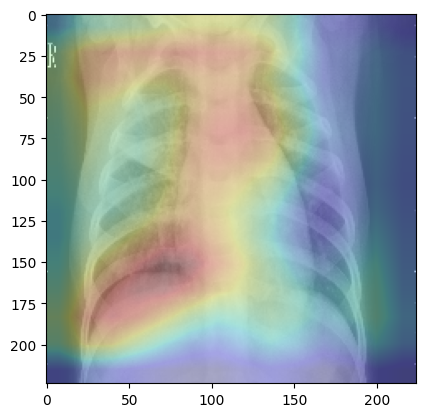

1
Pneumonia diagnosis results is bacterial


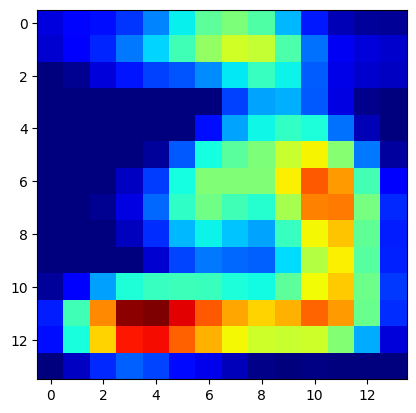

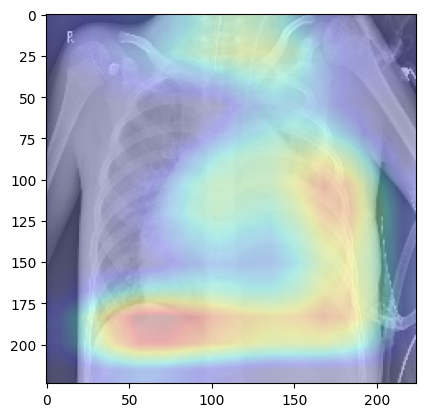

1
Pneumonia diagnosis results is bacterial


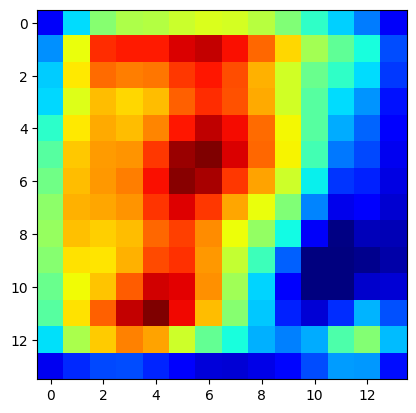

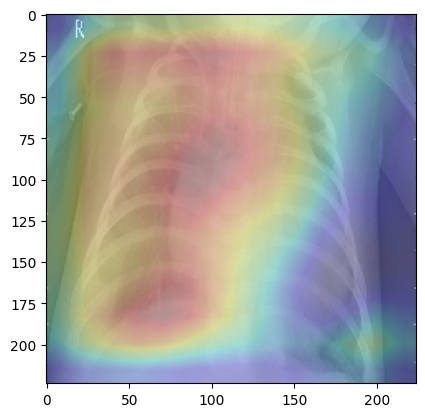

1
Pneumonia diagnosis results is Normal


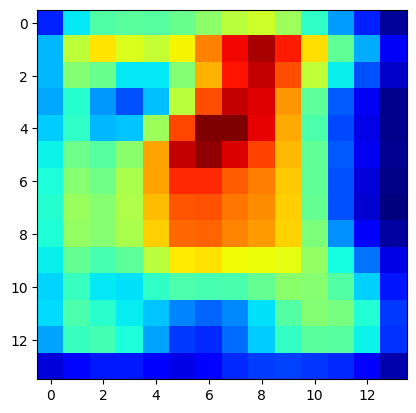

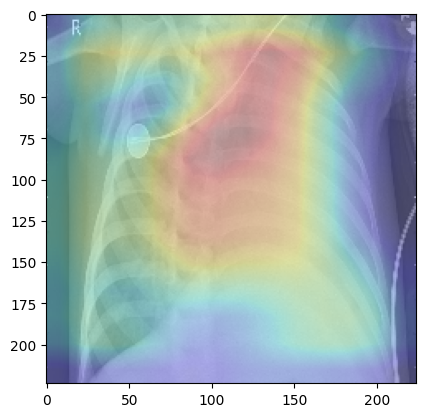

1
Pneumonia diagnosis results is Normal


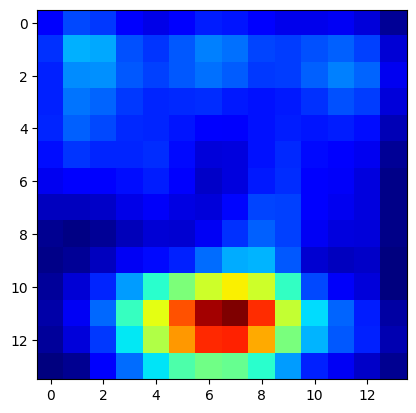

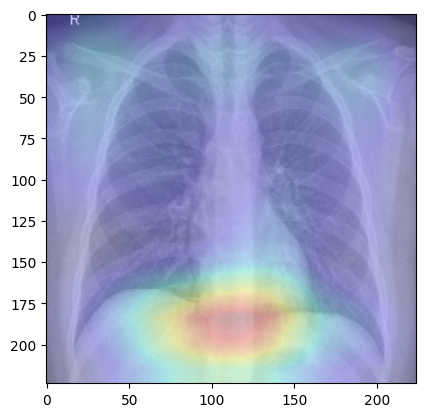

1
Pneumonia diagnosis results is viral


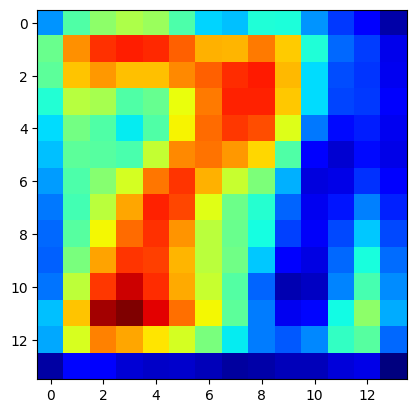

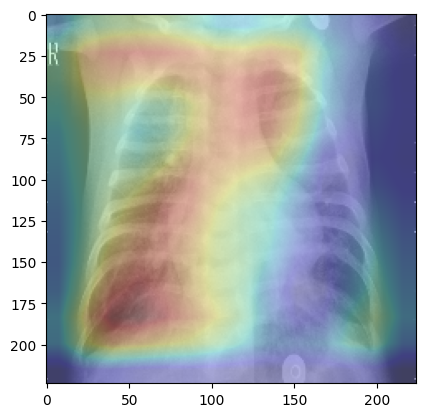

0
error => 결과가 없음
1
Pneumonia diagnosis results is Normal


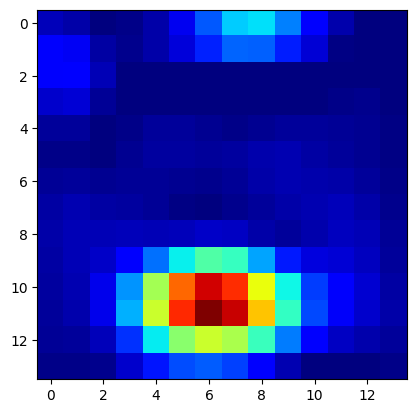

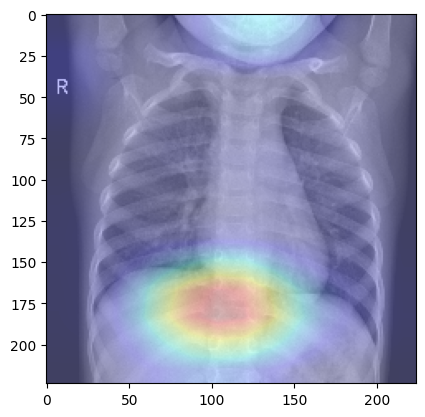

1
Pneumonia diagnosis results is viral


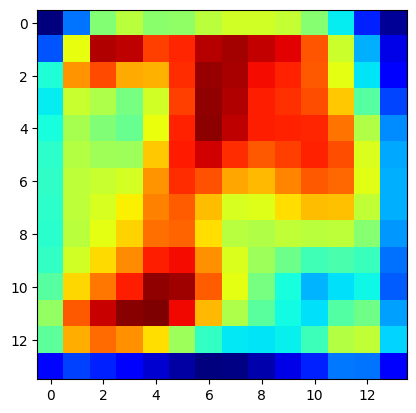

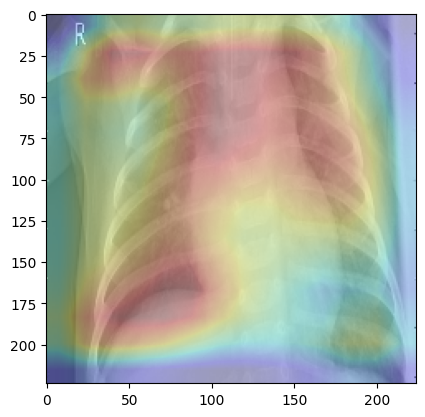

1
Pneumonia diagnosis results is viral


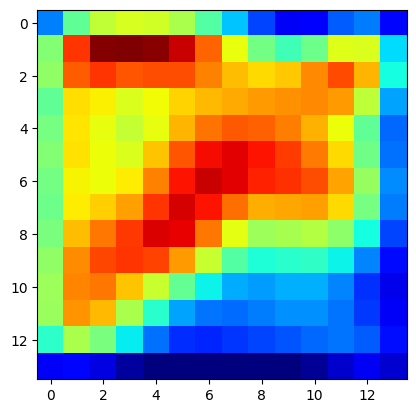

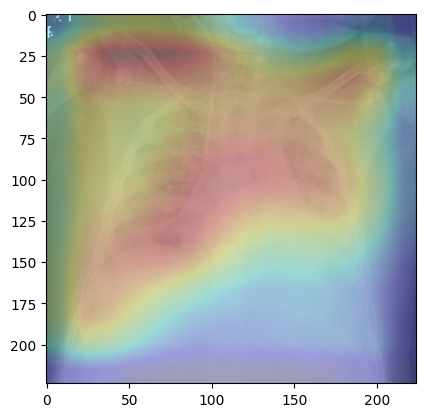

0
error => 결과가 없음
1
Pneumonia diagnosis results is viral


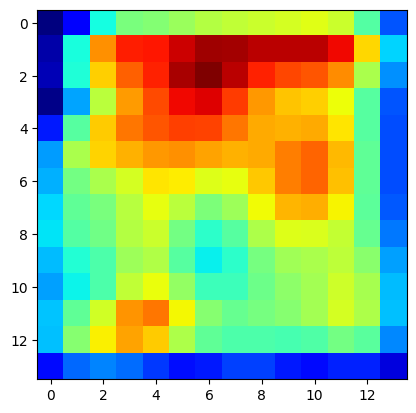

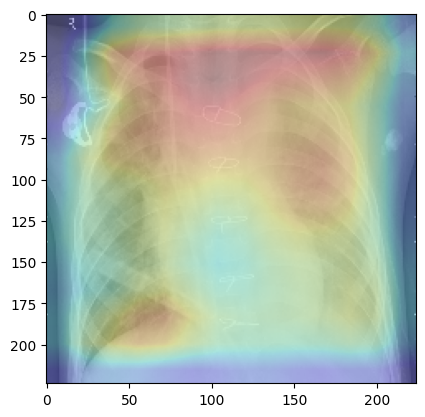

1
Pneumonia diagnosis results is Normal


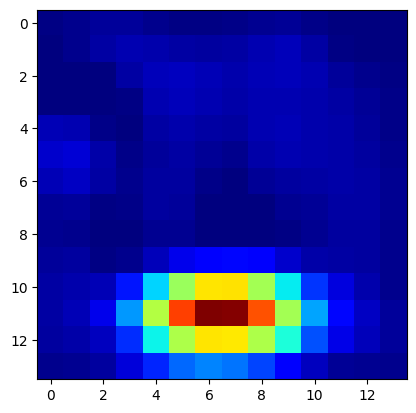

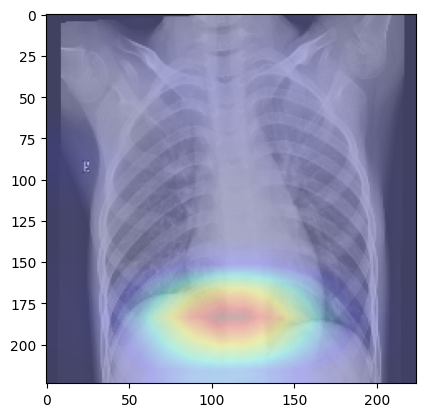

1
Pneumonia diagnosis results is Normal


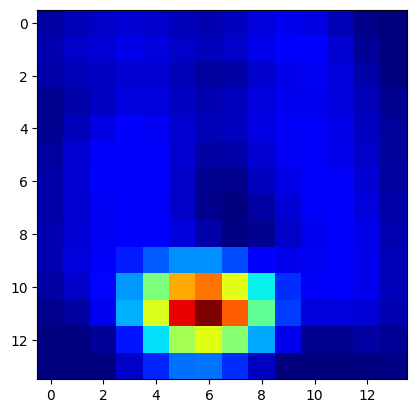

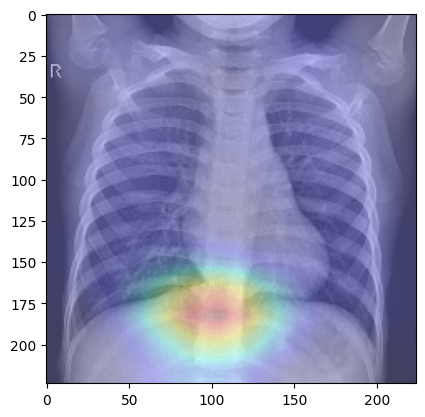

1
Pneumonia diagnosis results is Normal


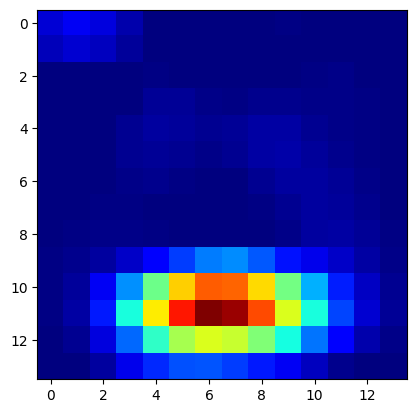

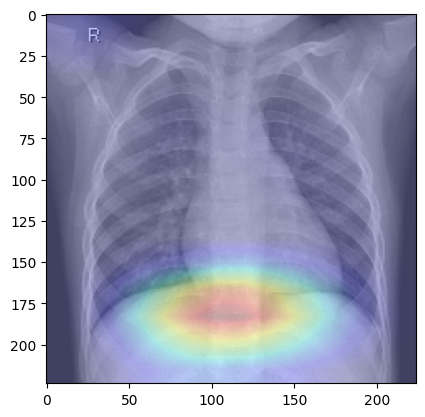

1
Pneumonia diagnosis results is Normal


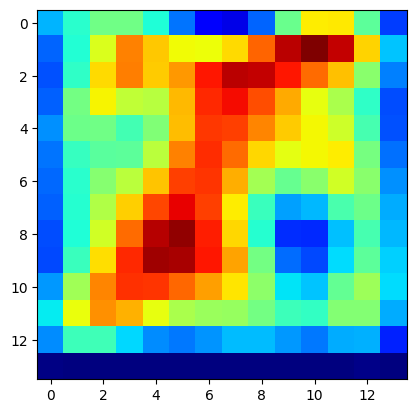

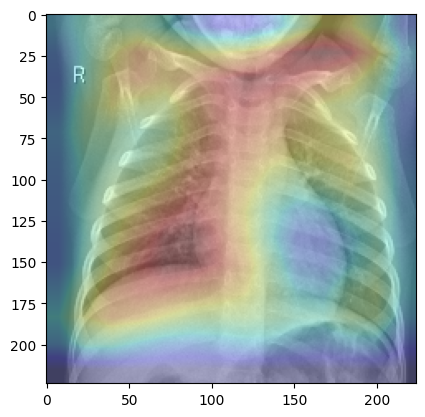

1
Pneumonia diagnosis results is Normal


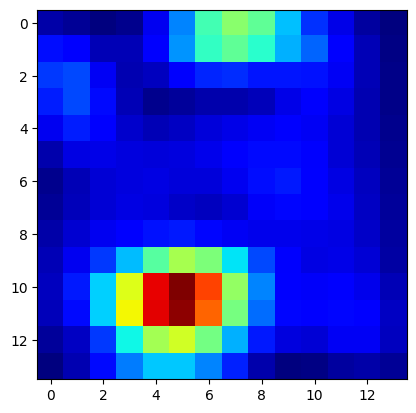

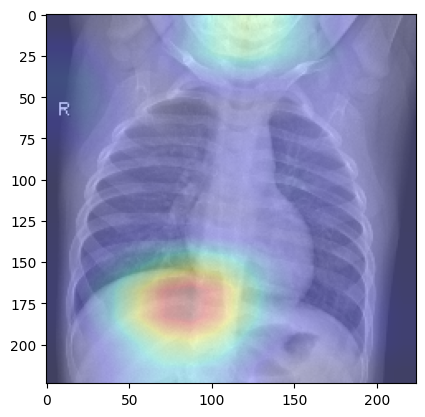

1
Pneumonia diagnosis results is Normal


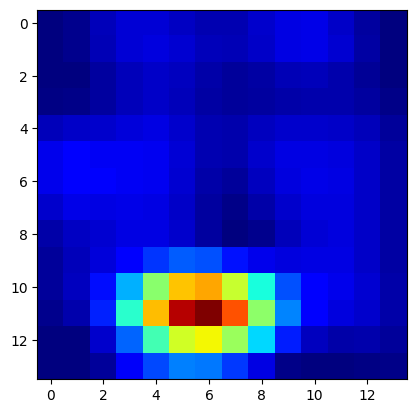

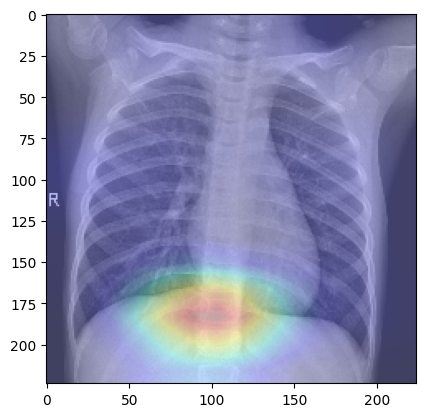

1
Pneumonia diagnosis results is viral


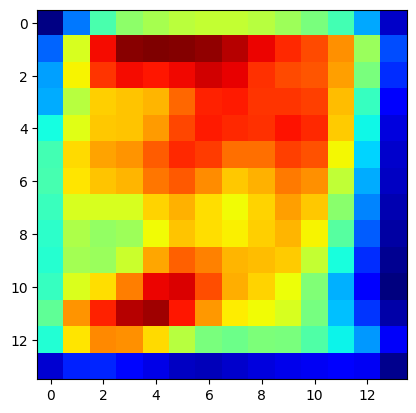

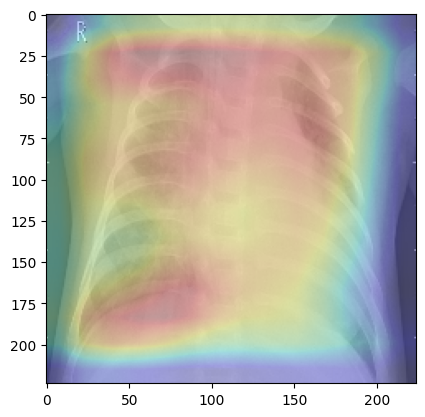

0
error => 결과가 없음
1
Pneumonia diagnosis results is bacterial


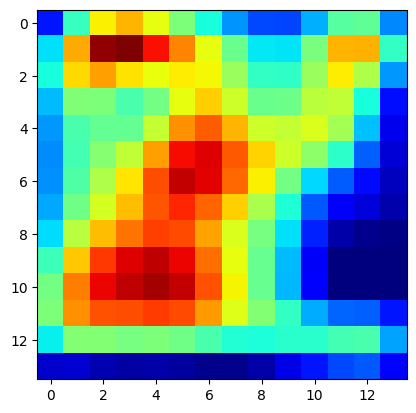

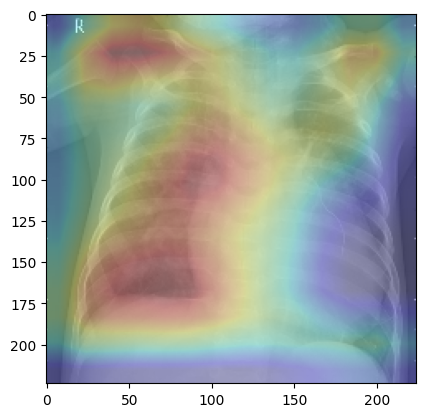

1
Pneumonia diagnosis results is viral


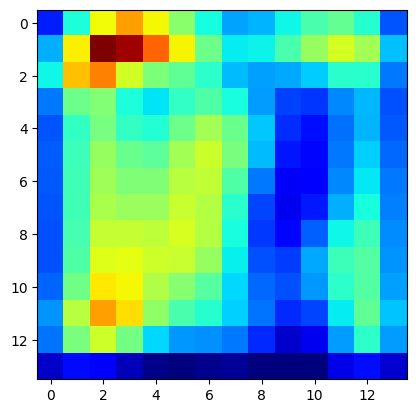

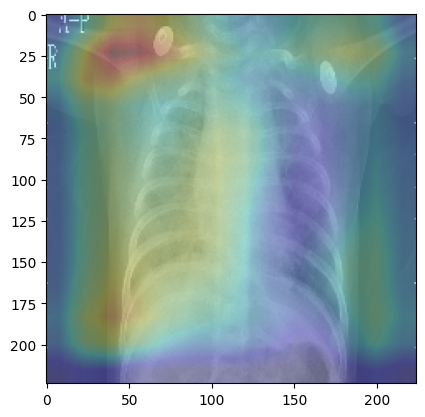

1
Pneumonia diagnosis results is Normal


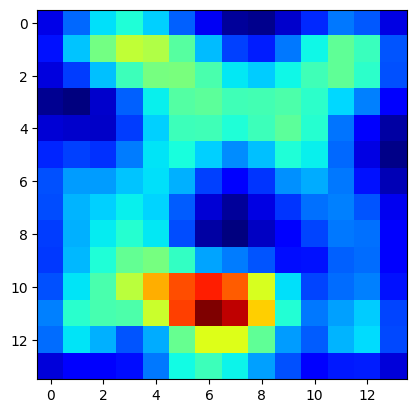

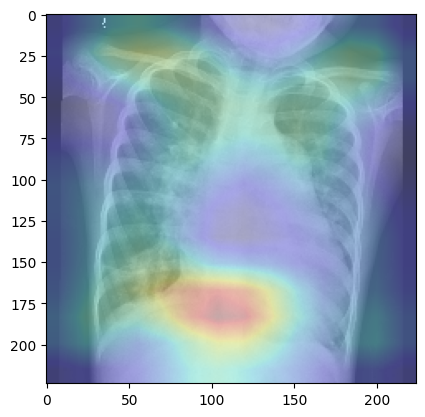

1
Pneumonia diagnosis results is bacterial


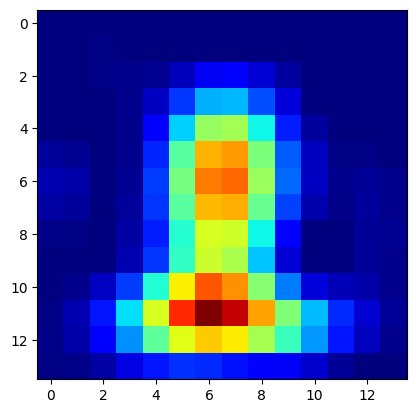

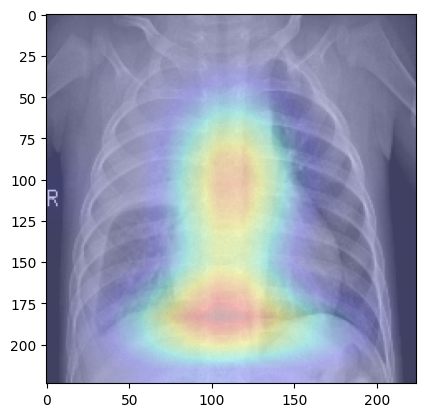

1
Pneumonia diagnosis results is Normal


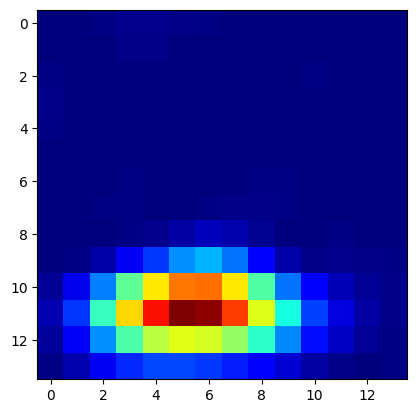

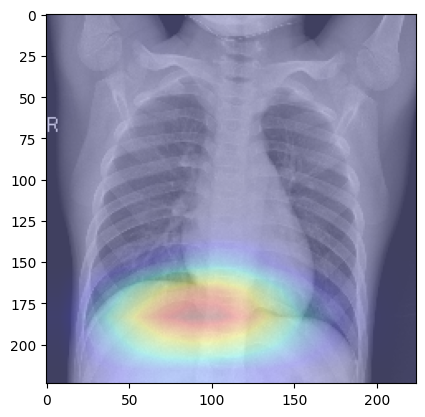

1
Pneumonia diagnosis results is Normal


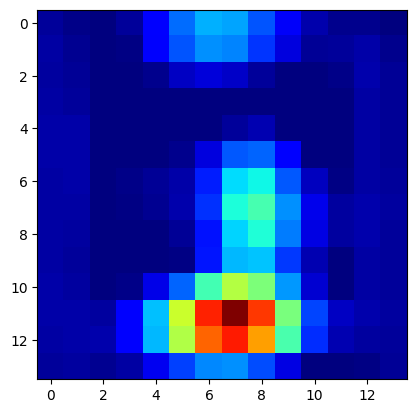

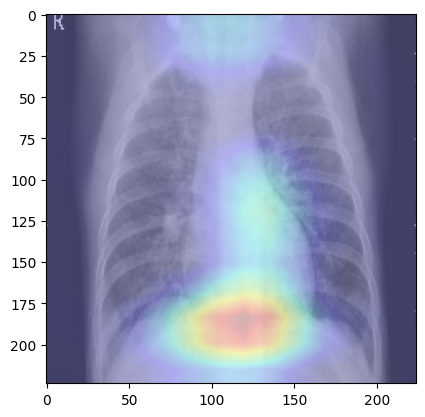

1
Pneumonia diagnosis results is viral


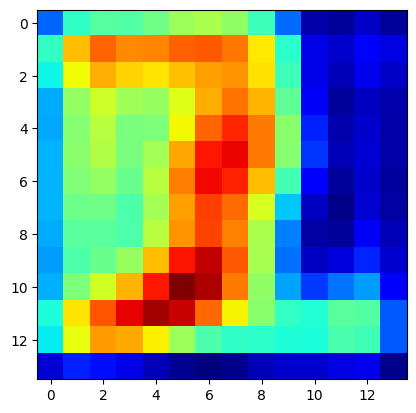

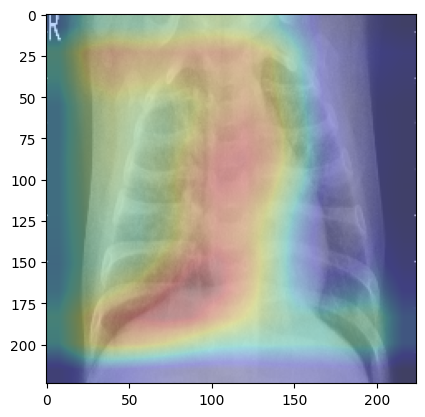

0
error => 결과가 없음
1
Pneumonia diagnosis results is bacterial


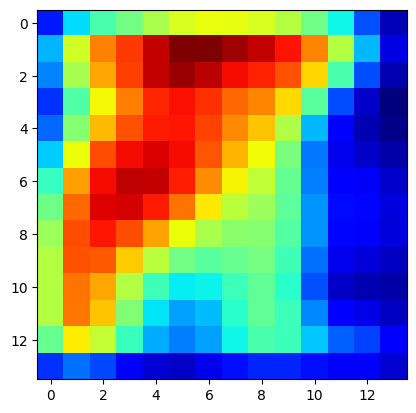

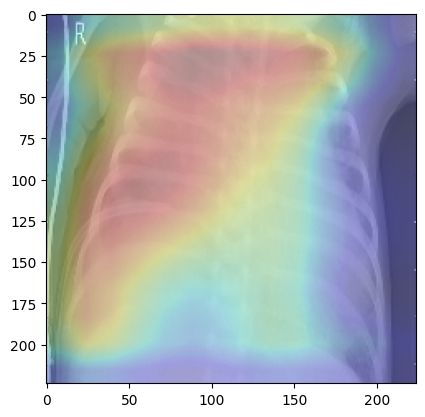

1
Pneumonia diagnosis results is Normal


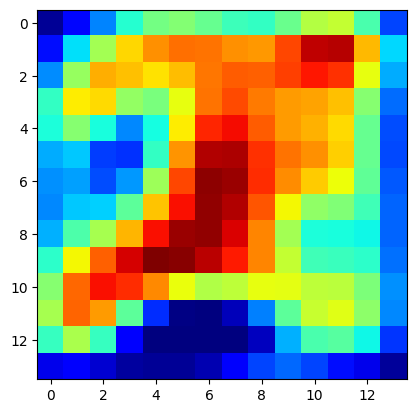

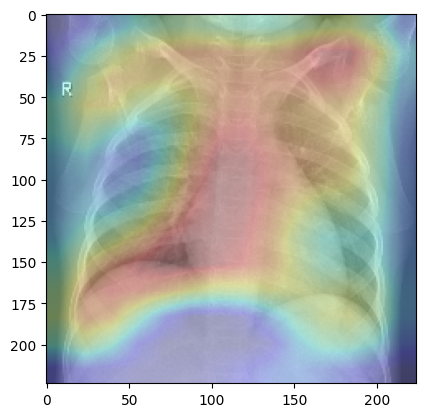

1
Pneumonia diagnosis results is viral


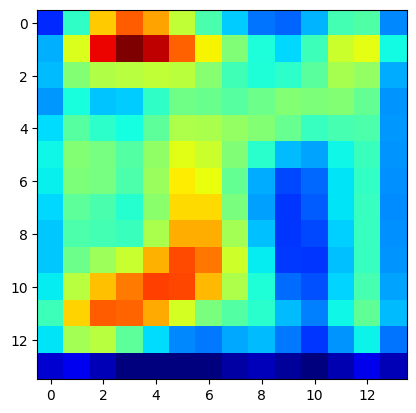

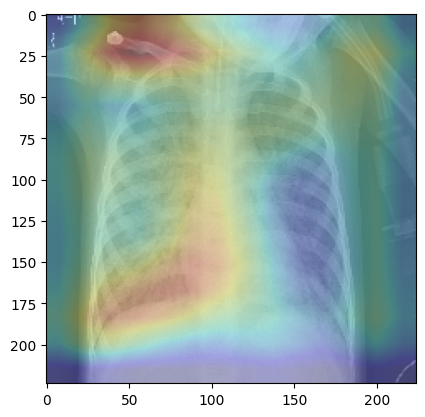

1
Pneumonia diagnosis results is Normal


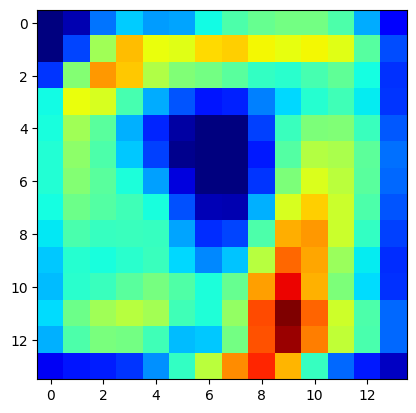

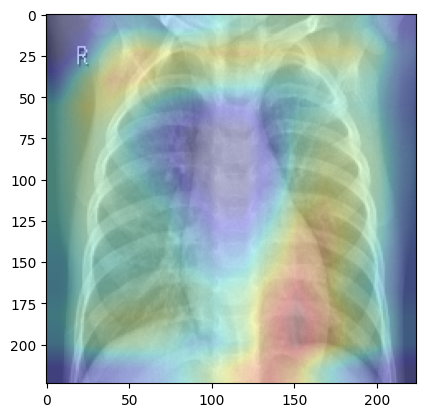

In [ ]:
# gradient를 구할 모델 구현

# 모델에서 마지막으로 convolution했던 레이어의 값과 모델의 마지막 값을 가져온다.
grad_model = tf.keras.models.Model(inputs = model.input, outputs=(model.layers[-10].output, model.output))

# with 부분은 모름 ㅠㅠ...       gradient 모델에 이미지 데이터를 넣어 예측값과 가중치값을 얻음.
for i in range(1000, 1100):
  with tf.GradientTape() as tape:
    [conv_outputs, predictions] = grad_model(X_train[i:i+1])

  idx = np.where(np.round(predictions).astype(int) == 1)
  print(idx[1].size)
  if idx[1].size == 1:
    if idx[1][0] == 0: result = 'Normal'
    elif idx[1][0] == 1: result = 'bacterial'
    elif idx[1][0] == 2: result = 'viral'
    else: result = 'error'
    print(f'Pneumonia diagnosis results is {result}')
    class_channel = predictions[:, idx[1][0]]
    grads = class_channel * conv_outputs
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()
    plt.imshow(heatmap, cmap='jet')
    plt.show()
    plt.imshow(cv2.resize(heatmap,(224, 224)),cmap='jet', alpha=0.5)
    plt.imshow(X_train[i], alpha=0.5)
    plt.show()
  else: print('error => 결과가 없음')

<ipython-input-26-bbc25f908888>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


1/1 [==============================] - 1s 594ms/step
(1, 3)


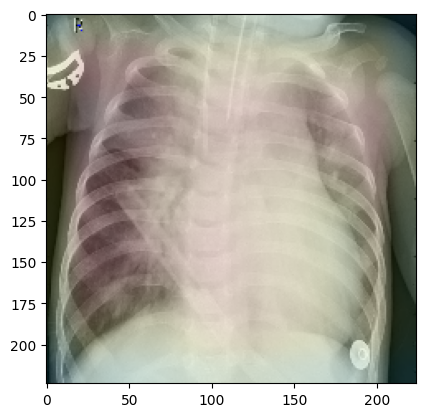

In [ ]:
# 이거 아님 !!!!!!!!!!!!!!!!!!!!
data = X_train[10:11]
heatmap = np.uint8(255 * heatmap)
jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]  # 0~255에 대응하는 RGB 값 불러오기 [256, 3]
jet_heatmap = jet_colors[heatmap]  # RGB 이미지가 됨 (왜 그렇게 되는지는 굉장히 어려워 보임 ...)

jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)  # 행렬을 이미지로 바꿔주기 (이미지 크기 바꾸기 위해)
jet_heatmap = jet_heatmap.resize((data[0].shape[1], data[0].shape[0]))     # 히트맵 사이즈를 이미지 크기로 바꿔주기
jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)  # 이미지를 행렬로 바꿔주기
superimposed_img = 1
superimposed_img = jet_heatmap * 0.1 + (X_train[10]*255)  # 히트맵과 이미지 겹치기 (덧셈 연산으로 가능)
superimposed_img = np.uint8(superimposed_img)
preds = model.predict(data)
print(preds.shape)
plt.imshow(superimposed_img)

In [ ]:
model.save('/content/drive/Shareddrives/딥러닝 1조/chest X-Ray/1_team_model2.h5')

In [ ]:
model = tf.keras.models.load_model('/content/drive/Shareddrives/딥러닝 1조/chest X-Ray/1_team_model')

In [ ]:
history = model.history

In [ ]:
print(history.history)

{}


In [ ]:
weight = model.layers[-7].weights[0] @ model.layers[-5].weights[0] @ model.layers[-3].weights[0] @ model.layers[-1].weights[0]

In [ ]:
# tf.reshape(weight, (7,7,512))
weight_m = np.reshape(np.array(weight), (3,7,7,-1))
for i in range(len(weight_m)):
  weight_m[i] = cv2.resize(weight_m[i], (224, 224))

ValueError: ignored

In [ ]:
output_m = model.layers[-11].output
output_m = np.array(output_m[0])

TypeError: ignored

In [ ]:
print(3*7*7*512)
print(weight_m.shape)

75264
(3, 7, 7, 512)


In [ ]:
conv_outputs.shape

(1, 7, 7, 512)

In [ ]:
tf.make_ndarray(output_m)

AttributeError: ignored

In [ ]:
grad = np.zeros((7,7,512))
grad = conv_outputs * weight_m[0]
grad += conv_outputs * weight_m[1]
grad += conv_outputs * weight_m[2]

In [ ]:
s = cv2.resize(s,(224,224))

In [ ]:
img = np.zeros((224,224))

In [ ]:
for i in range(512):
  img += grad[:,:,i]

In [ ]:
grad.shape

(1, 7, 7, 512)

In [ ]:
grad = grad[0]
s = np.zeros((7,7))
for i in range(512):
  s += grad[:,:,i]

In [ ]:
print(grad[:,:,1].shape)
print(img.shape)

(224, 224)
(224, 224)


In [ ]:
weight_m[0].shape

(7, 7, 512)

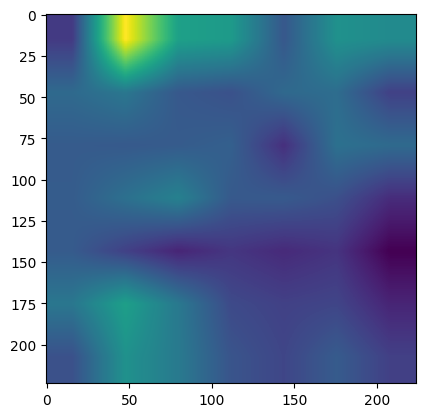

In [ ]:
plt.imshow(s)